# RANDOM FOREST LBP

# LEVEL 1 CLASIFICATION

In [1]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from skimage.feature import local_binary_pattern


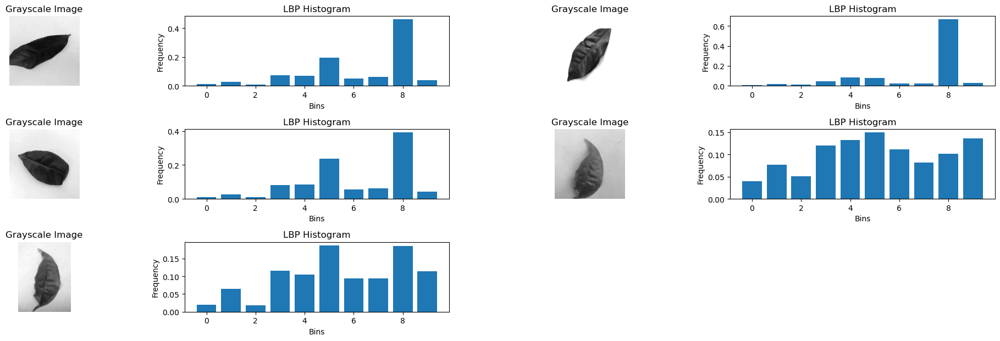

In [3]:

# Define LBP parameters
radius = 1
n_points = 8 * radius

def extract_lbp_features(image_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Compute LBP
    lbp = local_binary_pattern(image, n_points, radius, method='uniform')
    
    # Calculate the histogram of LBP and normalize it
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    
    return image, hist


# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Get list of image file paths
image_files = [os.path.join(dataset_directory, folder, filename) for folder in os.listdir(dataset_directory) for filename in os.listdir(os.path.join(dataset_directory, folder))]

# Choose 5 random images
random_image_files = np.random.choice(image_files, 5, replace=False)

# Extract features and images for visualization
visualize_images = [extract_lbp_features(image_file) for image_file in random_image_files]

# Filter out invalid images
visualize_images = [(image, hist) for image, hist in visualize_images if image is not None and hist is not None]

# Plot grayscale images and histograms
plt.figure(figsize=(20, 10))
for i, (image, hist) in enumerate(visualize_images):
    plt.subplot(5, 4, i*2+1)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title('Grayscale Image')
    
    plt.subplot(5, 4, i*2+2)
    plt.bar(np.arange(len(hist)), hist)
    plt.title('LBP Histogram')
    plt.xlabel('Bins')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [4]:
# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Specify image preprocessing parameters
target_width = 224
target_height = 224
batch_size = 32

# Image data generator for preprocessing and data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    dataset_directory,
    target_size=(target_width, target_height),
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=True,  
    seed=42
)

class_mapping = train_generator.class_indices
class_counts = {class_label: sum(train_generator.classes == class_index) for class_label, class_index in class_mapping.items()}


Found 1489 images belonging to 2 classes.


In [5]:
for class_label, count in class_counts.items():
    print(f'{class_label}: {count} samples')

# Convert labels to binary: 1 for infected, 0 for healthy
labels = (train_generator.classes == class_mapping["infected"]).astype(int)

# Split the dataset into training and testing sets
X_train_files, X_test_files, y_train, y_test = train_test_split(train_generator.filepaths, labels, test_size=0.2, random_state=42)

# Check for imbalance
unique_classes, class_counts = np.unique(y_train, return_counts=True)
if len(unique_classes) < 2:
    raise ValueError("Dataset is imbalanced. Minimum of 2 classes are required.")


healthy: 197 samples
infected: 1292 samples


In [6]:
# Extract LBP features for training data
X_train = []
for image_path in X_train_files:
    image, hist = extract_lbp_features(image_path)
    if hist is not None:
        X_train.append(hist)
    else:
        print(f"Error: Unable to extract LBP features for {image_path}")

# Convert to numpy array
X_train = np.array(X_train)


In [7]:
# Extract LBP features for testing data
X_test = []
for image_path in X_test_files:
    image, hist = extract_lbp_features(image_path)
    if hist is not None:
        X_test.append(hist)
    else:
        print(f"Error: Unable to extract LBP features for {image_path}")

# Convert to numpy array
X_test = np.array(X_test)


In [8]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the Random Forest classifier
clf = RandomForestClassifier(random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)



In [9]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

Accuracy: 93.29%
Precision: 0.95
Recall: 0.98
F1-Score: 0.96


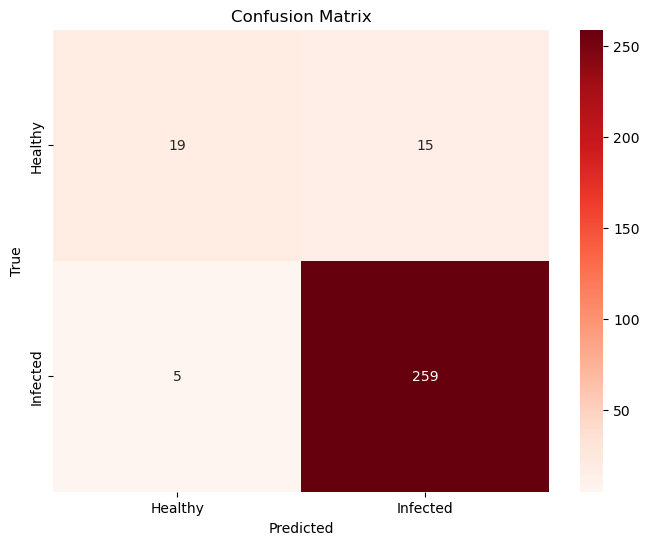

In [10]:
# Calculate F1-score
f1 = f1_score(y_test, y_pred)

# Print accuracy, precision, recall, and F1-score
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
labels = ['Healthy', 'Infected']
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Reds', fmt='g', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# LEVEL 2 CLASSIFICATION

Disease: red leaf spot, Image: UNADJUSTEDNONRAW_thumb_1a5.jpg


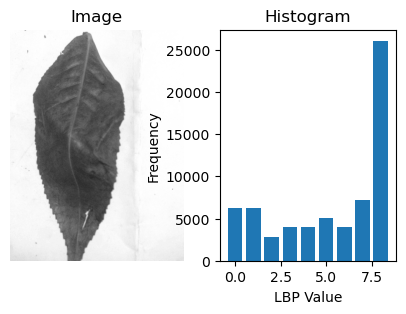


Disease: red leaf spot, Image: UNADJUSTEDNONRAW_thumb_1b7.jpg


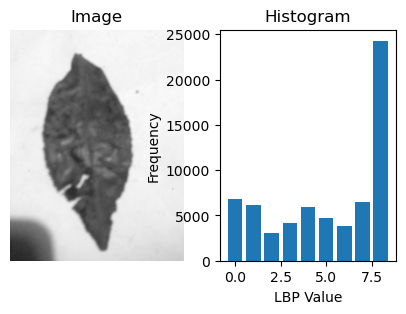


Disease: white spot, Image: UNADJUSTEDNONRAW_thumb_9a.jpg


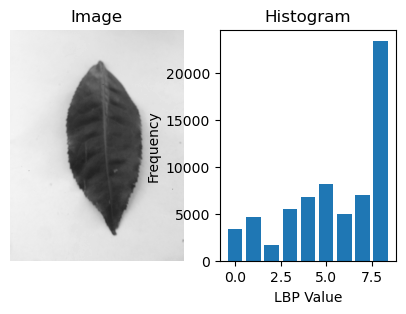


Disease: white spot, Image: UNADJUSTEDNONRAW_thumb_b5.jpg


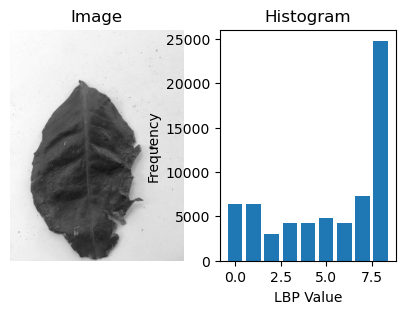


Disease: algal leaf, Image: 20211227_102403.jpg


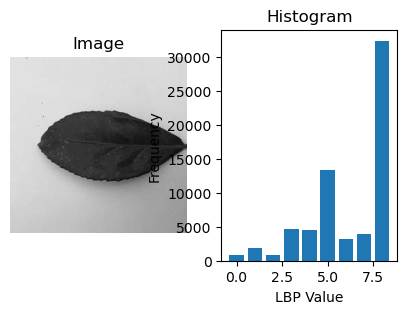


Disease: algal leaf, Image: UNADJUSTEDNONRAW_thumb_15.jpg


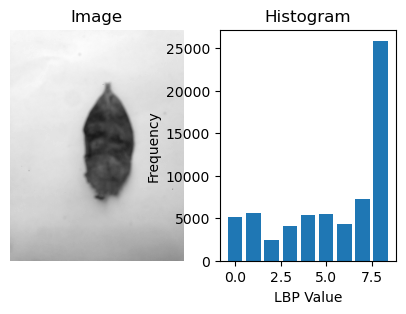


Disease: gray blight, Image: IMG_20220503_141224.jpg


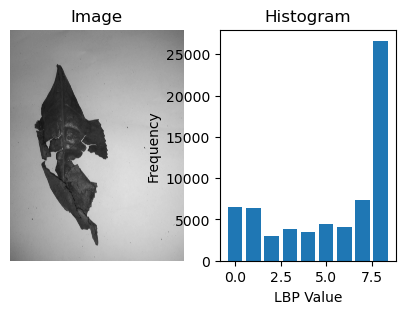


Disease: gray blight, Image: IMG_20220503_141957.jpg


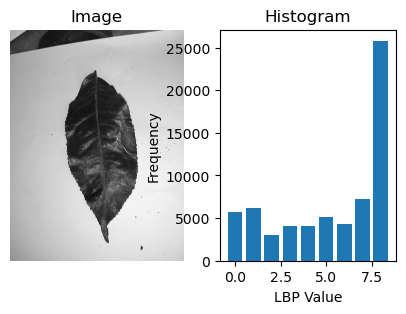


Disease: anthracnose, Image: IMG_20220503_144002.jpg


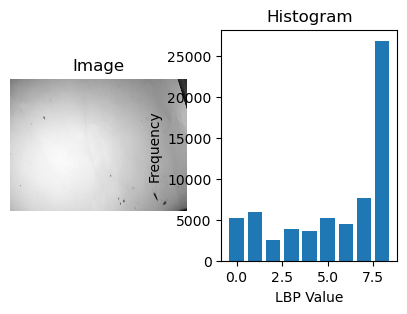


Disease: anthracnose, Image: IMG_20220503_144012.jpg


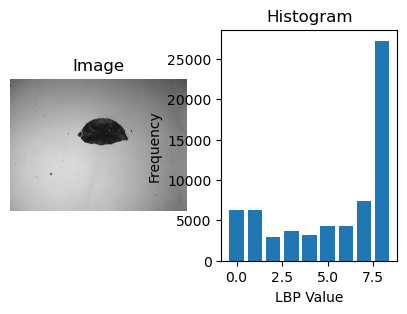


Disease: bird eye spot, Image: IMG_20220503_154153.jpg


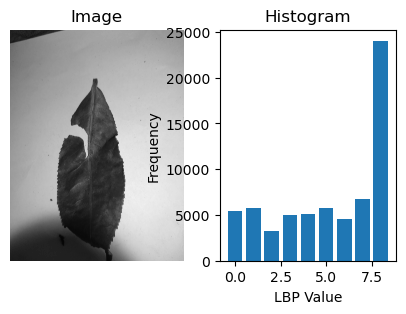


Disease: bird eye spot, Image: IMG_20220503_155303.jpg


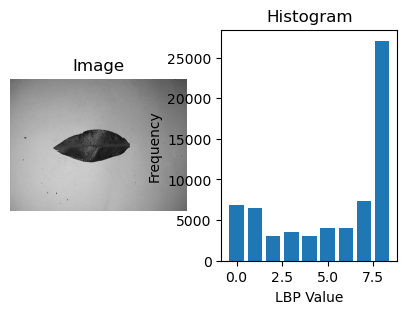


Disease: brown blight, Image: UNADJUSTEDNONRAW_thumb_137.jpg


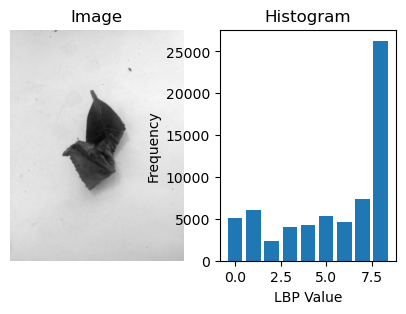


Disease: brown blight, Image: image_0_933.jpg


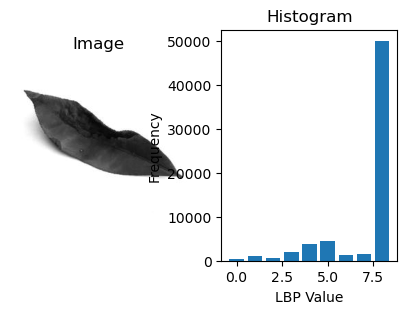


Disease: helopeltis, Image: 20220101_093613.jpg


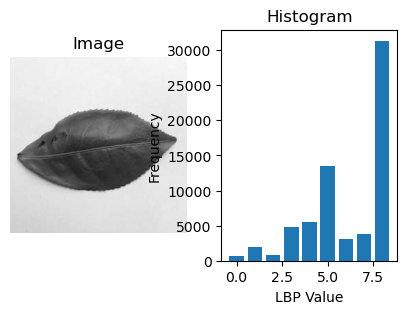


Disease: helopeltis, Image: 20220101_104250.jpg


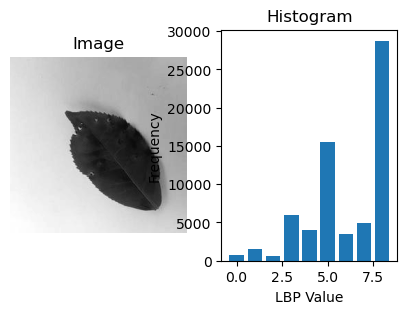

In [13]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from sklearn.ensemble import RandomForestClassifier
from skimage.feature import local_binary_pattern
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt

# Function to extract LBP features from an image
def extract_lbp_features(image):
    # Resize the image to a smaller size
    resized_image = cv2.resize(image, (256, 256))
    # Compute LBP
    lbp = local_binary_pattern(resized_image, 8, 1, method='uniform')
    # Calculate histogram of LBP
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 10), range=(0, 9))
    return hist


# Function to display an image along with its histogram
def display_image_with_histogram(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    lbp_features = extract_lbp_features(image)

    plt.figure(figsize=(5, 3))

    # Plot the image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Image')
    plt.axis('off')

    # Plot the histogram
    plt.subplot(1, 2, 2)
    plt.bar(range(len(lbp_features)), lbp_features)
    plt.title('Histogram')
    plt.xlabel('LBP Value')
    plt.ylabel('Frequency')

    plt.show()

# Define paths for each disease category
disease_paths = {
    "red leaf spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/red leaf spot",
    "white spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/white spot",
    "algal leaf": "C:/Users/HP/Downloads/tea leaf/categories/infected/algal leaf",
    "gray blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/gray blight",
    "anthracnose": "C:/Users/HP/Downloads/tea leaf/categories/infected/anthracnose",
    "bird eye spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/bird eye spot",
    "brown blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/brown blight",
    "helopeltis": "C:/Users/HP/Downloads/tea leaf/categories/infected/helopeltis"
}

# Define the number of random images to display
num_images = 2

# Randomly select images from all paths
random_images = []
for disease, path in disease_paths.items():
    image_files = [f for f in os.listdir(path) if f.endswith('.jpg')]
    random_images.extend(random.sample(image_files, min(num_images, len(image_files))))

# Display the random images along with their histograms
for image_name in random_images:
    for disease, path in disease_paths.items():
        if image_name in os.listdir(path):
            image_path = os.path.join(path, image_name)
            print(f"Disease: {disease}, Image: {image_name}")
            display_image_with_histogram(image_path)
            print()
            break  # Stop searching in other paths once the image is found


In [14]:
 #Initialize lists to store features and labels
X = []
y = []



In [15]:
# Load images and extract features
for disease, path in disease_paths.items():
    print(f"Processing images for {disease}...")
    for filename in os.listdir(path):
        try:
            if not filename.endswith('.DS_Store'):  # Skip .DS_Store files
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                features = extract_lbp_features(image)
                if features is not None:
                    X.append(features)
                    y.append(disease)  # Use disease name as label
        except Exception as e:
            print(f"Error processing image {filename}: {e}")



Processing images for red leaf spot...
Processing images for white spot...
Processing images for algal leaf...
Processing images for gray blight...
Processing images for anthracnose...
Processing images for bird eye spot...
Processing images for brown blight...
Processing images for helopeltis...


In [16]:
# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)


Accuracy: 59.46%
Precision: 59.64%
F1 Score: 58.65%


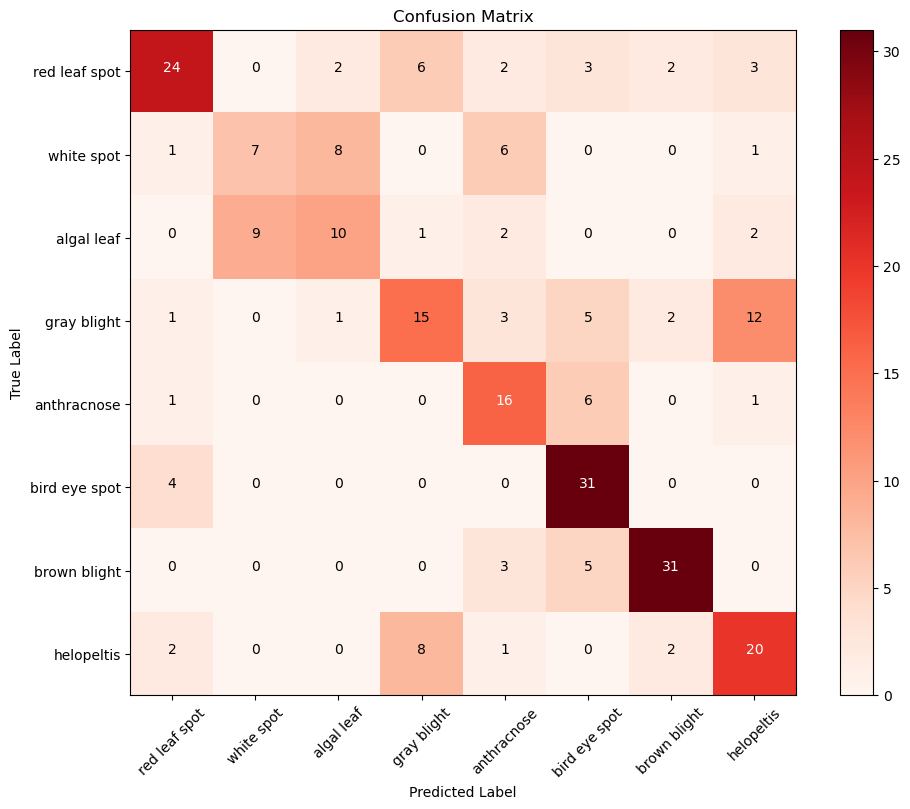

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit label encoder and transform the target labels for both training and testing sets
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Initialize the Random Forest Classifier
rf_clf = RandomForestClassifier(max_depth=7, random_state=42)

# Train the model
rf_clf.fit(X_train, y_train_encoded)

# Make predictions on the test data
y_pred_encoded = rf_clf.predict(X_test)

# Decode the predicted labels back to original class names
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Calculate accuracy in percentage
accuracy = accuracy_score(y_test, y_pred) * 100

# Calculate precision in percentage
precision = precision_score(y_test, y_pred, average='weighted') * 100

# Calculate F1 score in percentage
f1 = f1_score(y_test, y_pred, average='weighted') * 100

print("Accuracy:", "{:.2f}%".format(accuracy))
print("Precision:", "{:.2f}%".format(precision))
print("F1 Score:", "{:.2f}%".format(f1))

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = list(disease_paths.keys())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)

# Display values in each cell
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# RANDOM FOREST USING HOG

# LEVEL 1 CLASSIFICATION 

In [18]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.feature import hog
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from skimage.io import imread
from skimage.transform import resize



# Function to extract HOG features from an image
def extract_hog_features(image_path):
    # Read the image
    image = imread(image_path, as_gray=True)
    
    # Resize image to a fixed size (e.g., 128x128)
    resized_image = resize(image, (128, 128))
    
    # Compute HOG features
    features = hog(resized_image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys', visualize=False, multichannel=False)
    
    return features



In [20]:
# Path to the dataset
dataset_directory ="C:/Users/HP/Downloads/tea leaf/categories"
# Specify image preprocessing parameters
target_width = 128
target_height = 128
batch_size = 32



# Image data generator for preprocessing and data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    dataset_directory,
    target_size=(target_width, target_height),
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=True,  
    seed=42
)


class_mapping = train_generator.class_indices
class_counts = {class_label: sum(train_generator.classes == class_index) for class_label, class_index in class_mapping.items()}
for class_label, count in class_counts.items():
    print(f'{class_label}: {count} samples')




Found 1489 images belonging to 2 classes.
healthy: 197 samples
infected: 1292 samples


In [21]:
# Convert labels to binary: 1 for infected, 0 for healthy
labels = (train_generator.classes == class_mapping["infected"]).astype(int)



# Split the dataset into training and testing sets
X_train_files, X_test_files, y_train, y_test = train_test_split(train_generator.filepaths, labels, test_size=0.2, random_state=42)


In [22]:
from skimage.feature import hog
from skimage.transform import resize

def extract_hog_features(image_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Check if the image is valid
    if image is None:
        print(f"Error loading image: {image_path}")
        return None
    
    # Resize the image
    resized_image = resize(image, (128, 128))
    
    # Compute HOG features
    features = hog(resized_image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys')
    
    return features


In [23]:
import cv2

# Extract HOG features for training data
X_train = np.array([extract_hog_features(image_path) for image_path in X_train_files])

# Extract HOG features for testing data
X_test = np.array([extract_hog_features(image_path) for image_path in X_test_files])


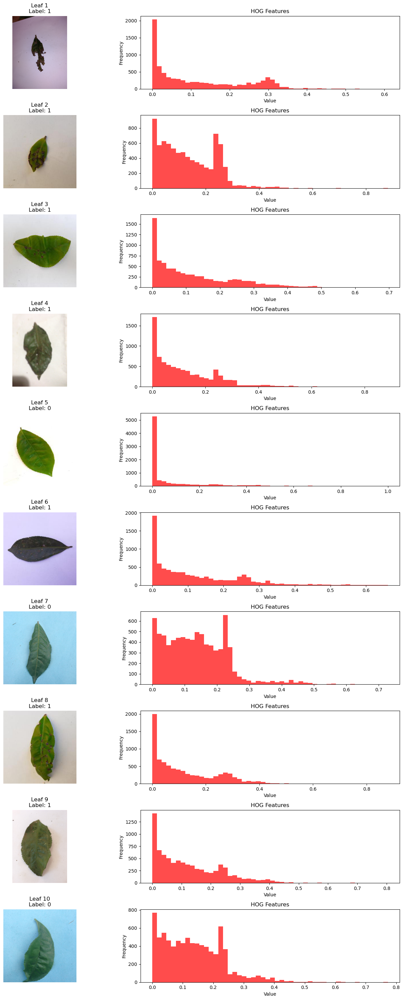

In [24]:
# Randomly select 10 image paths and labels
random_image_paths = np.random.choice(X_test_files, 10, replace=False)
random_labels = y_test[np.array([X_test_files.index(image_path) for image_path in random_image_paths])]

# Extract HOG features and plot leaf images with histograms as subplots
plt.figure(figsize=(15, 30))
for i, image_path in enumerate(random_image_paths, 1):
    # Extract HOG features
    features = extract_hog_features(image_path)
    
    # Plot leaf image
    plt.subplot(10, 2, 2*i-1)
    plt.imshow(imread(image_path), cmap='gray')
    plt.title(f"Leaf {i}\nLabel: {random_labels[i-1]}")
    plt.axis('off')
    
    # Plot histogram of HOG features
    plt.subplot(10, 2, 2*i)
    plt.hist(features, bins=50, color='Red', alpha=0.7)
    plt.title('HOG Features')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


Accuracy: 89.26%
Precision: 0.90
Recall: 0.99
F1-Score: 0.94


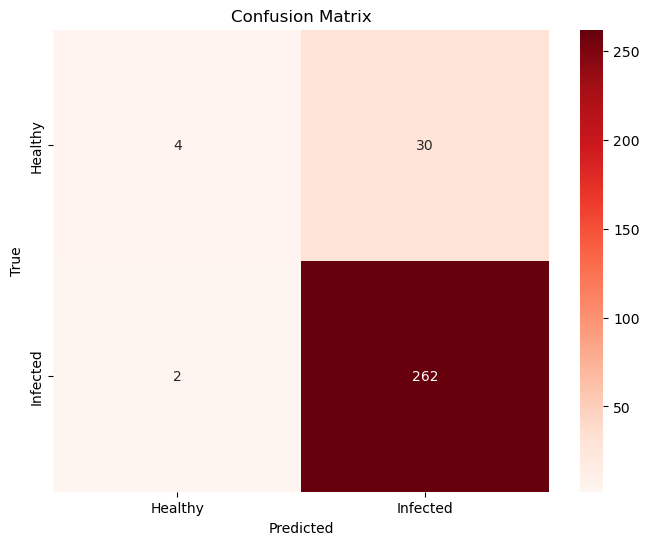

In [25]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the Random Forest classifier
clf = RandomForestClassifier(random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
labels = ['Healthy', 'Infected']
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Reds', fmt='g', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# LEVEL 2 CLASIFICATION

In [26]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.feature import hog
import random
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
from sklearn.preprocessing import LabelEncoder
import seaborn as sns


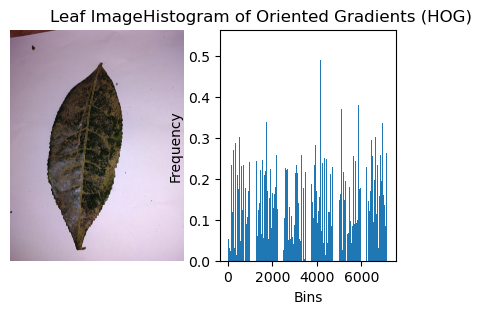

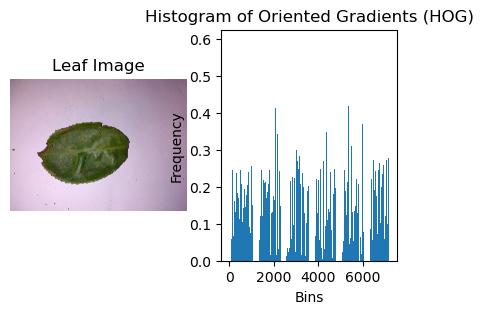

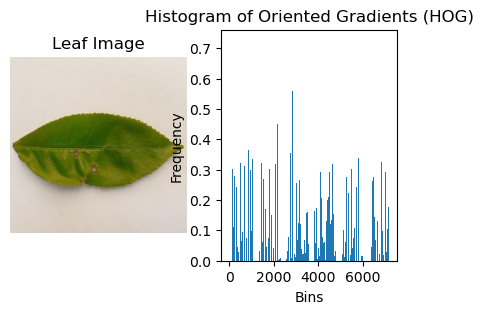

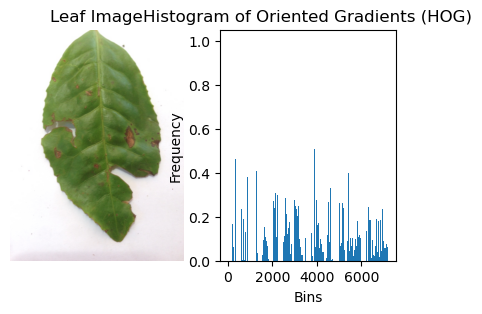

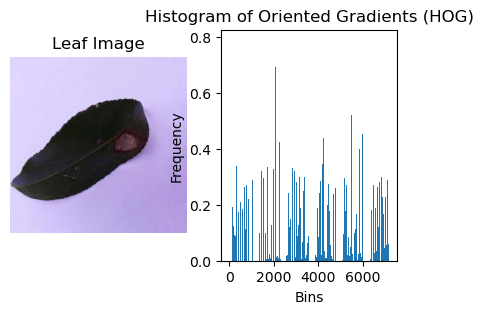

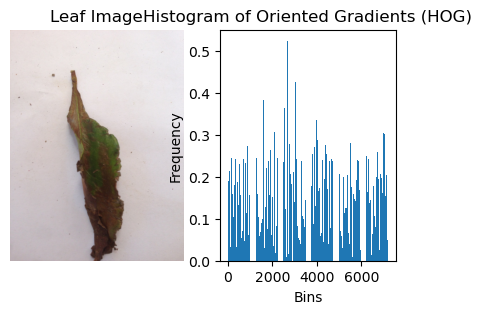

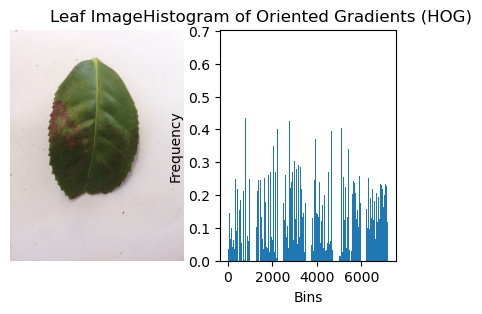

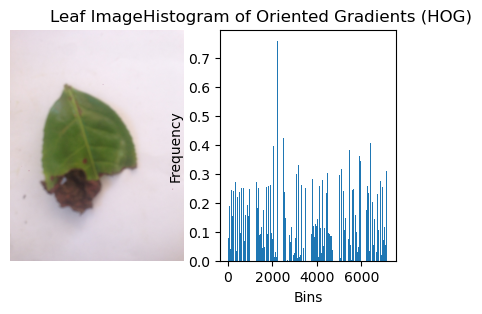

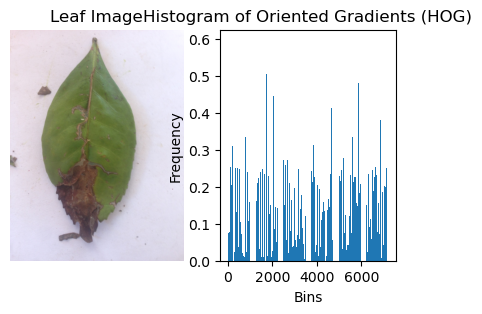

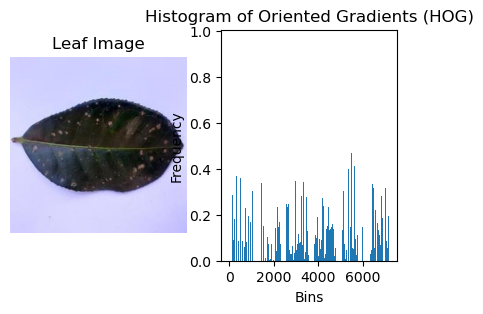

In [28]:

# Function to extract HOG features from an image
def extract_hog_features(image):
    # Ensure image has two spatial dimensions
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize the image if needed
    if image.shape != resize_shape:
        image = cv2.resize(image, resize_shape)
    
    hog_features, _ = hog(image, orientations=8, pixels_per_cell=(8, 8),
                          cells_per_block=(2, 2), visualize=True)
    return hog_features

# Function to load images, resize them, and extract features
def load_images_and_extract_features(disease_paths, resize_shape):
    images = []
    labels = []
    image_paths = []
    for disease, path in disease_paths.items():
        image_files = [f for f in os.listdir(path) if f.endswith('.jpg')]
        for image_name in image_files:
            image_path = os.path.join(path, image_name)
            image = cv2.imread(image_path)
            if image is None:
                print(f"Error reading image: {image_path}")
                continue
            
            hog_features = extract_hog_features(image)
            images.append(hog_features)
            labels.append(disease)
            image_paths.append(image_path)
    return images, labels, image_paths

# Define paths for each disease category
disease_paths = {
    "red leaf spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/red leaf spot",
    "white spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/white spot",
    "algal leaf": "C:/Users/HP/Downloads/tea leaf/categories/infected/algal leaf",
    "gray blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/gray blight",
    "anthracnose": "C:/Users/HP/Downloads/tea leaf/categories/infected/anthracnose",
    "bird eye spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/bird eye spot",
    "brown blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/brown blight",
    "helopeltis": "C:/Users/HP/Downloads/tea leaf/categories/infected/helopeltis"
}

# Define the size to which images will be resized
resize_shape = (128, 128)  # Adjust as needed

# Load images, resize them, and extract features
images, labels, image_paths = load_images_and_extract_features(disease_paths, resize_shape)

# Select 10 random leaf images along with their corresponding HOG features
random_indices = random.sample(range(len(images)), min(10, len(images)))
selected_images = [(images[i], labels[i], image_paths[i]) for i in random_indices]

# Display selected leaf images along with their HOG features
for hog_features, label, image_path in selected_images:
    # Load the corresponding leaf image
    leaf_image = cv2.imread(image_path)
    
    plt.figure(figsize=(5, 3))
    
    # Display the leaf image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(leaf_image, cv2.COLOR_BGR2RGB))
    plt.title('Leaf Image')
    plt.axis('off')
    
    # Display histogram
    plt.subplot(1, 2, 2)
    plt.bar(range(len(hog_features)), hog_features)
    plt.title('Histogram of Oriented Gradients (HOG)')
    plt.xlabel('Bins')
    plt.ylabel('Frequency')
    
    plt.show()


In [29]:
 #Initialize lists to store features and labels
X = []
y = []


# Load images and extract features
for disease, path in disease_paths.items():
    print(f"Processing images for {disease}...")
    for filename in os.listdir(path):
        try:
            if not filename.endswith('.DS_Store'):  # Skip .DS_Store files
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                features = extract_hog_features(image)
                if features is not None:
                    X.append(features)
                    y.append(disease)  # Use disease name as label
        except Exception as e:
            print(f"Error processing image {filename}: {e}")



Processing images for red leaf spot...
Processing images for white spot...
Processing images for algal leaf...
Processing images for gray blight...
Processing images for anthracnose...
Processing images for bird eye spot...
Processing images for brown blight...
Processing images for helopeltis...


In [30]:
# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [31]:
from sklearn.preprocessing import LabelEncoder
# Convert string labels to numerical using LabelEncoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Initialize and train the Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train_encoded)

# Make predictions on the test data
y_pred_encoded = rf_clf.predict(X_test)

# Decode predicted labels back to original strings
y_pred = label_encoder.inverse_transform(y_pred_encoded)


Accuracy: 57.53%
Precision: 58.11%
F1 Score: 56.35%


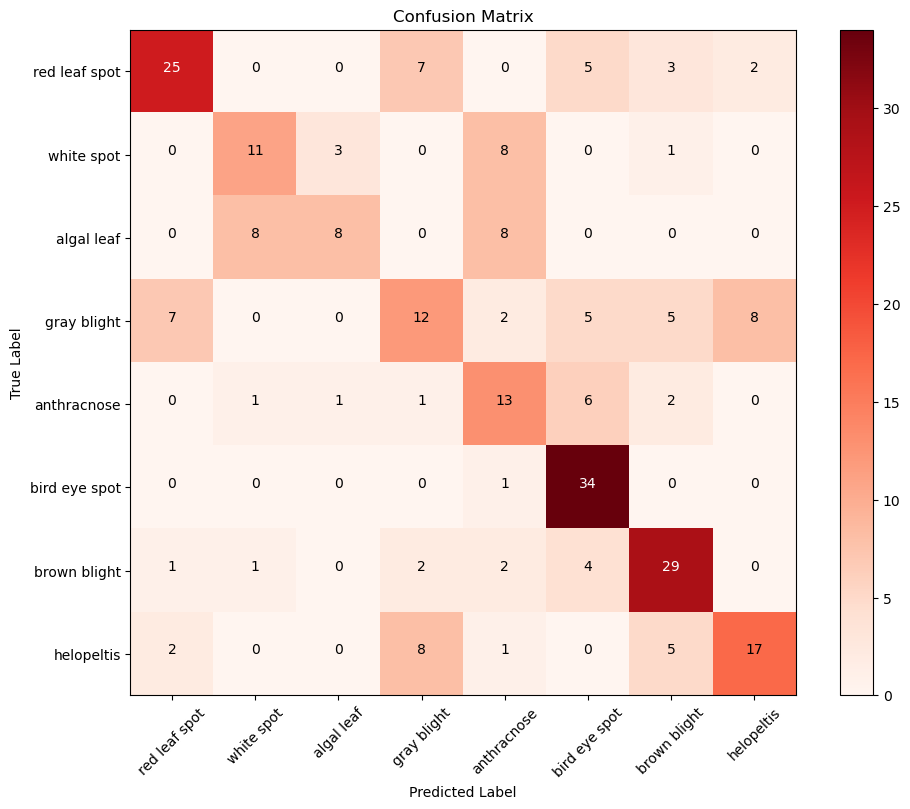

In [32]:
# import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Calculate accuracy in percentage
accuracy = accuracy_score(y_test, y_pred) * 100

# Calculate precision in percentage
precision = precision_score(y_test, y_pred, average='weighted') * 100

# Calculate F1 score in percentage
f1 = f1_score(y_test, y_pred, average='weighted') * 100

print("Accuracy:", "{:.2f}%".format(accuracy))
print("Precision:", "{:.2f}%".format(precision))
print("F1 Score:", "{:.2f}%".format(f1))

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = list(disease_paths.keys())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)

# Display values in each cell
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# XGB LBP

# LEVEL 1 CLASIFICATION

In [33]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from skimage.feature import local_binary_pattern

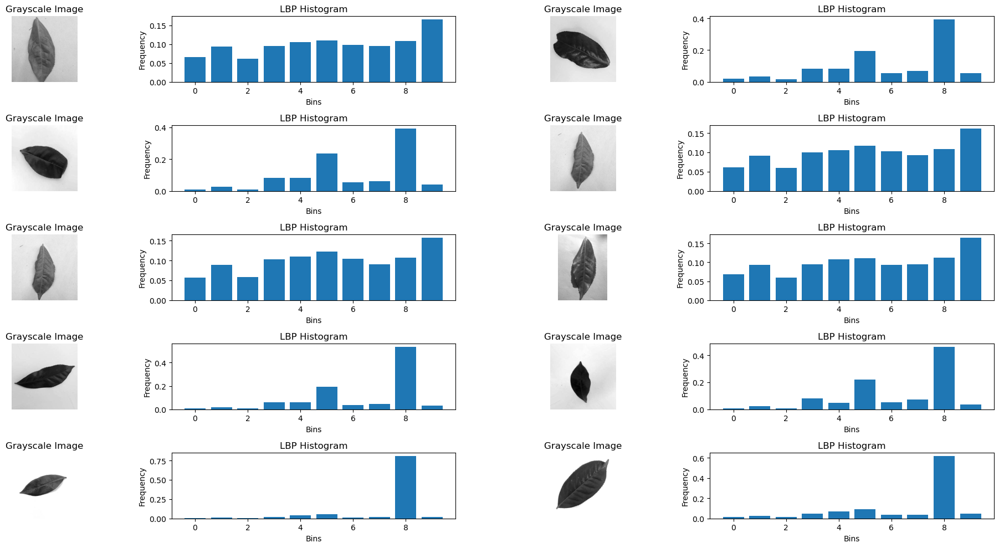

In [34]:
def extract_lbp_features(image_path, n_points=8, radius=1):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
   
    # Compute LBP
    lbp = local_binary_pattern(image, n_points, radius, method='uniform')
    
    # Calculate the histogram of LBP and normalize it
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    
    return image, hist

# Define the parameters for LBP
n_points = 8
radius = 1

# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Get list of image file paths
image_files = [os.path.join(dataset_directory, folder, filename) for folder in os.listdir(dataset_directory) for filename in os.listdir(os.path.join(dataset_directory, folder))]

# Choose 10 random images
random_image_files = np.random.choice(image_files, 10, replace=False)

# Extract features and images for visualization
visualize_images = [extract_lbp_features(image_file, n_points, radius) for image_file in random_image_files]

# Filter out invalid images
visualize_images = [(image, hist) for image, hist in visualize_images if image is not None and hist is not None]

# Plot grayscale images and histograms
plt.figure(figsize=(20, 10))
for i, (image, hist) in enumerate(visualize_images):
    plt.subplot(5, 4, i*2+1)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title('Grayscale Image')
    
    plt.subplot(5, 4, i*2+2)
    plt.bar(np.arange(len(hist)), hist)
    plt.title('LBP Histogram')
    plt.xlabel('Bins')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [35]:
# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Specify image preprocessing parameters
target_width = 224
target_height = 224
batch_size = 32

# Image data generator for preprocessing and data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    dataset_directory,
    target_size=(target_width, target_height),
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=True,  
    seed=42
)

class_mapping = train_generator.class_indices
class_counts = {class_label: sum(train_generator.classes == class_index) for class_label, class_index in class_mapping.items()}


for class_label, count in class_counts.items():
    print(f'{class_label}: {count} samples')

# Convert labels to binary: 1 for infected, 0 for healthy
labels = (train_generator.classes == class_mapping["infected"]).astype(int)

# Split the dataset into training and testing sets
X_train_files, X_test_files, y_train, y_test = train_test_split(train_generator.filepaths, labels, test_size=0.2, random_state=42)

# Check for imbalance
unique_classes, class_counts = np.unique(y_train, return_counts=True)
if len(unique_classes) < 2:
    raise ValueError("Dataset is imbalanced. Minimum of 2 classes are required.")


Found 1489 images belonging to 2 classes.
healthy: 197 samples
infected: 1292 samples


In [36]:
# Extract LBP features for training data
X_train = []
for image_path in X_train_files:
    image, hist = extract_lbp_features(image_path)
    if hist is not None:
        X_train.append(hist)
    else:
        print(f"Error: Unable to extract LBP features for {image_path}")

# Convert to numpy array
X_train = np.array(X_train)


In [37]:
# Extract LBP features for testing data
X_test = []
for image_path in X_test_files:
    image, hist = extract_lbp_features(image_path)
    if hist is not None:
        X_test.append(hist)
    else:
        print(f"Error: Unable to extract LBP features for {image_path}")

# Convert to numpy array
X_test = np.array(X_test)


In [38]:
# Initialize the XGBClassifier
clf = XGBClassifier(random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)




Accuracy: 92.62%
Precision: 0.95
Recall: 0.97
F1-Score: 0.96


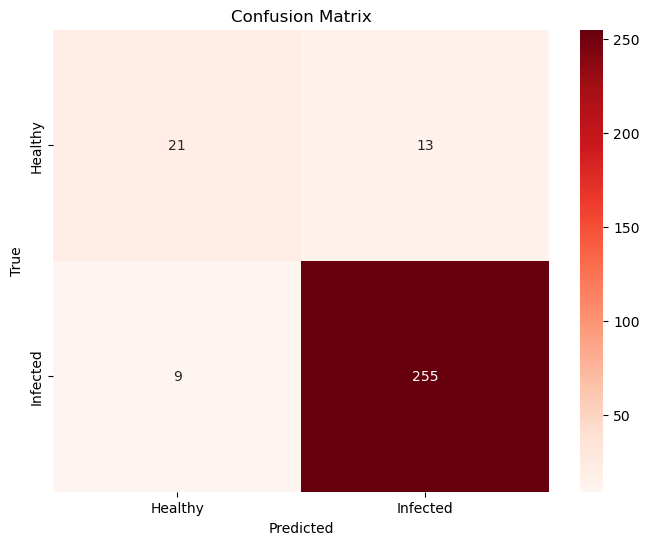

In [39]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

# Calculate F1-score
f1 = f1_score(y_test, y_pred)

# Print accuracy, precision, recall, and F1-score
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
labels = ['Healthy', 'Infected']
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Reds', fmt='g', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# LEVEL 2 CLASSIFICATION

Disease: red leaf spot, Image: image_0_5.jpg


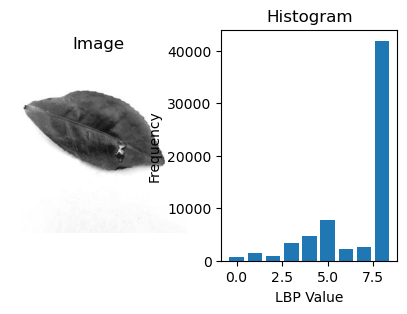


Disease: red leaf spot, Image: UNADJUSTEDNONRAW_thumb_1a8.jpg


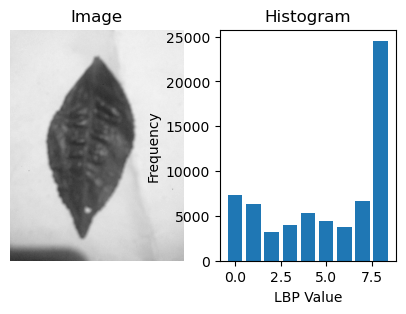


Disease: white spot, Image: UNADJUSTEDNONRAW_thumb_a3.jpg


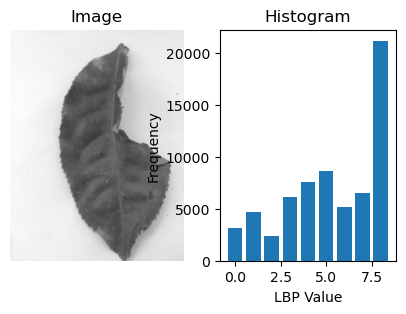


Disease: white spot, Image: UNADJUSTEDNONRAW_thumb_df.jpg


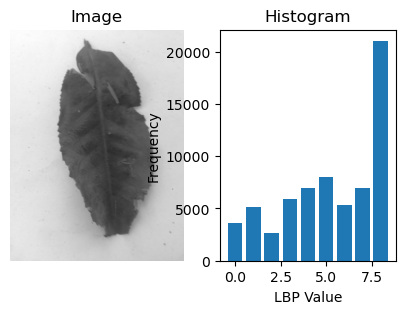


Disease: algal leaf, Image: UNADJUSTEDNONRAW_thumb_2e.jpg


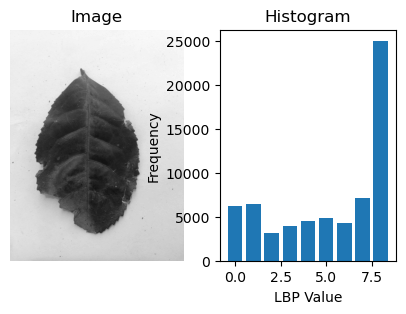


Disease: algal leaf, Image: UNADJUSTEDNONRAW_thumb_48.jpg


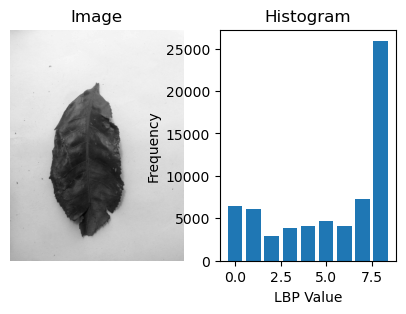


Disease: gray blight, Image: IMG_20220503_135816.jpg


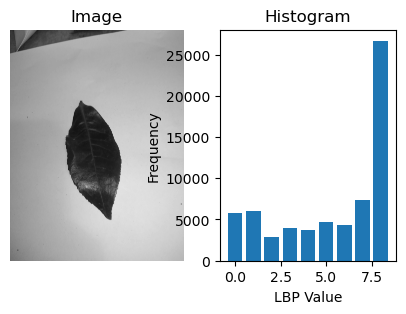


Disease: gray blight, Image: IMG_20220503_141709.jpg


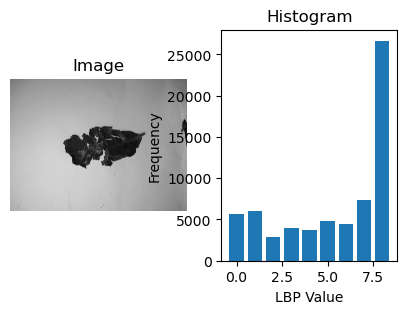


Disease: anthracnose, Image: IMG_20220503_143501.jpg


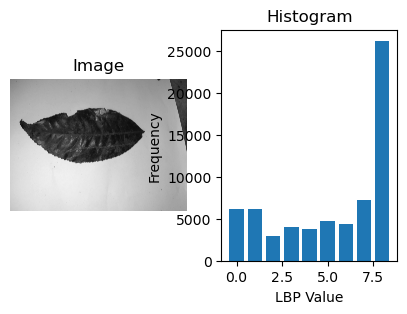


Disease: anthracnose, Image: IMG_20220503_144737.jpg


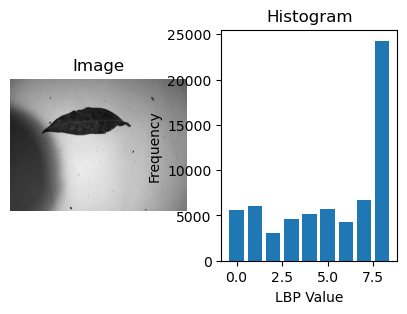


Disease: bird eye spot, Image: IMG_20220503_155741.jpg


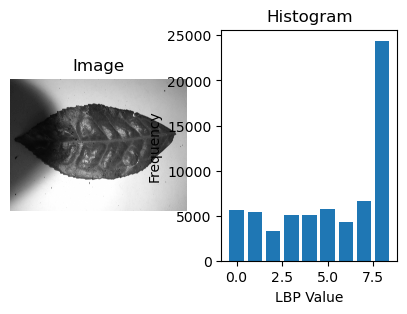


Disease: bird eye spot, Image: IMG_20220503_154341.jpg


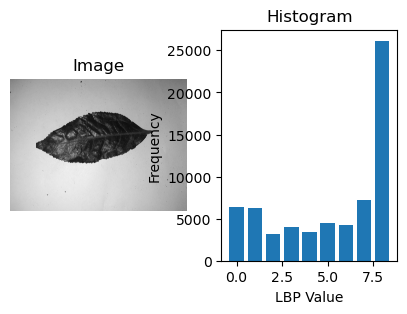


Disease: brown blight, Image: image_0_1195.jpg


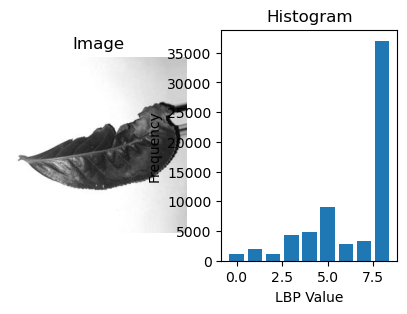


Disease: brown blight, Image: UNADJUSTEDNONRAW_thumb_11e.jpg


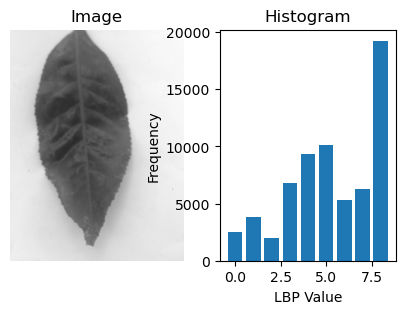


Disease: helopeltis, Image: 20220101_094358.jpg


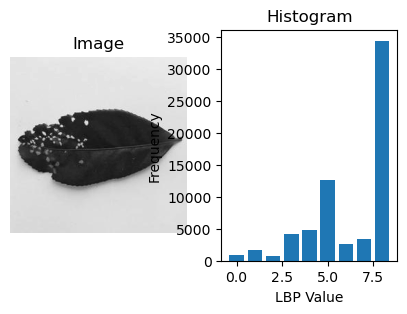


Disease: helopeltis, Image: 20220101_102424.jpg


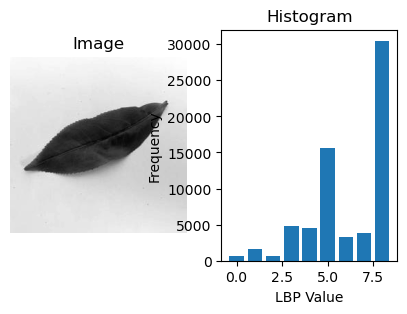

In [40]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from skimage.feature import local_binary_pattern
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt

# Function to extract LBP features from an image
def extract_lbp_features(image):
    # Resize the image to a smaller size
    resized_image = cv2.resize(image, (256, 256))
    # Compute LBP
    lbp = local_binary_pattern(resized_image, 8, 1, method='uniform')
    # Calculate histogram of LBP
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 10), range=(0, 9))
    return hist


# Function to display an image along with its histogram
def display_image_with_histogram(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    lbp_features = extract_lbp_features(image)

    plt.figure(figsize=(5, 3))

    # Plot the image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Image')
    plt.axis('off')

    # Plot the histogram
    plt.subplot(1, 2, 2)
    plt.bar(range(len(lbp_features)), lbp_features)
    plt.title('Histogram')
    plt.xlabel('LBP Value')
    plt.ylabel('Frequency')

    plt.show()

# Define paths for each disease category
disease_paths = {
    "red leaf spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/red leaf spot",
    "white spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/white spot",
    "algal leaf": "C:/Users/HP/Downloads/tea leaf/categories/infected/algal leaf",
    "gray blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/gray blight",
    "anthracnose": "C:/Users/HP/Downloads/tea leaf/categories/infected/anthracnose",
    "bird eye spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/bird eye spot",
    "brown blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/brown blight",
    "helopeltis": "C:/Users/HP/Downloads/tea leaf/categories/infected/helopeltis"
}

# Define the number of random images to display
num_images = 2

# Randomly select images from all paths
random_images = []
for disease, path in disease_paths.items():
    image_files = [f for f in os.listdir(path) if f.endswith('.jpg')]
    random_images.extend(random.sample(image_files, min(num_images, len(image_files))))

# Display the random images along with their histograms
for image_name in random_images:
    for disease, path in disease_paths.items():
        if image_name in os.listdir(path):
            image_path = os.path.join(path, image_name)
            print(f"Disease: {disease}, Image: {image_name}")
            display_image_with_histogram(image_path)
            print()
            break  # Stop searching in other paths once the image is found


In [41]:
 #Initialize lists to store features and labels
X = []
y = []



In [42]:
# Load images and extract features
for disease, path in disease_paths.items():
    print(f"Processing images for {disease}...")
    for filename in os.listdir(path):
        try:
            if not filename.endswith('.DS_Store'):  # Skip .DS_Store files
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                features = extract_lbp_features(image)
                if features is not None:
                    X.append(features)
                    y.append(disease)  # Use disease name as label
        except Exception as e:
            print(f"Error processing image {filename}: {e}")



Processing images for red leaf spot...
Processing images for white spot...
Processing images for algal leaf...
Processing images for gray blight...
Processing images for anthracnose...
Processing images for bird eye spot...
Processing images for brown blight...
Processing images for helopeltis...


In [43]:
# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)


Accuracy: 58.69%
Precision: 58.15%
F1 Score: 58.10%


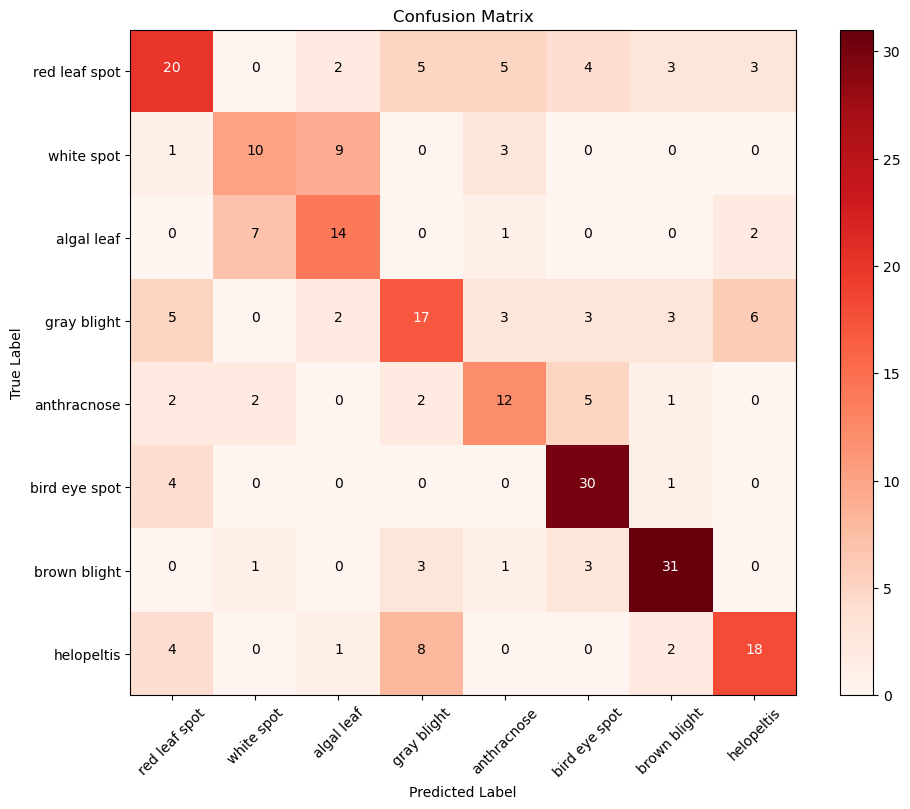

In [44]:

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

 #Initialize the label encoder
label_encoder = LabelEncoder()

# Fit label encoder and transform the target labels for both training and testing sets
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Initialize the XGBoost Classifier without specifying num_class
xgb_clf = xgb.XGBClassifier(objective='multi:softmax', max_depth=7)

# Train the model
xgb_clf.fit(X_train, y_train_encoded)

# Make predictions on the test data
y_pred_encoded = xgb_clf.predict(X_test)

# Decode the predicted labels back to original class names
y_pred = label_encoder.inverse_transform(y_pred_encoded)


# Calculate accuracy in percentage
accuracy = accuracy_score(y_test, y_pred) * 100

# Calculate precision in percentage
precision = precision_score(y_test, y_pred, average='weighted') * 100

# Calculate F1 score in percentage
f1 = f1_score(y_test, y_pred, average='weighted') * 100

print("Accuracy:", "{:.2f}%".format(accuracy))
print("Precision:", "{:.2f}%".format(precision))
print("F1 Score:", "{:.2f}%".format(f1))

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = list(disease_paths.keys())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)

# Display values in each cell
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# XGB HOG

# LEVEL 1 CLASIFICATION

In [45]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.feature import hog
from skimage.io import imread
from skimage.transform import resize
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [46]:
# Function to extract HOG features from an image
def extract_hog_features(image_path):
    # Read the image
    image = imread(image_path, as_gray=True)
    
    # Resize image to a fixed size (e.g., 128x128)
    resized_image = resize(image, (128, 128))
    
    # Compute HOG features
    features = hog(resized_image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys', visualize=False, multichannel=False)
    
    return features



In [47]:
# Path to the dataset
dataset_directory ="C:/Users/HP/Downloads/tea leaf/categories"
# Specify image preprocessing parameters
target_width = 128
target_height = 128
batch_size = 32



# Image data generator for preprocessing and data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    dataset_directory,
    target_size=(target_width, target_height),
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=True,  
    seed=42
)


class_mapping = train_generator.class_indices
class_counts = {class_label: sum(train_generator.classes == class_index) for class_label, class_index in class_mapping.items()}
for class_label, count in class_counts.items():
    print(f'{class_label}: {count} samples')


# Convert labels to binary: 1 for infected, 0 for healthy
labels = (train_generator.classes == class_mapping["infected"]).astype(int)



Found 1489 images belonging to 2 classes.
healthy: 197 samples
infected: 1292 samples


In [48]:
# Split the dataset into training and testing sets
X_train_files, X_test_files, y_train, y_test = train_test_split(train_generator.filepaths, labels, test_size=0.2, random_state=42)


In [49]:
from skimage.feature import hog
from skimage.transform import resize

def extract_hog_features(image_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Check if the image is valid
    if image is None:
        print(f"Error loading image: {image_path}")
        return None
    
    # Resize the image
    resized_image = resize(image, (128, 128))
    
    # Compute HOG features
    features = hog(resized_image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys')
    
    return features


In [50]:
import cv2
# Extract HOG features for training data
X_train = np.array([extract_hog_features(image_path) for image_path in X_train_files])

# Extract HOG features for testing data
X_test = np.array([extract_hog_features(image_path) for image_path in X_test_files])


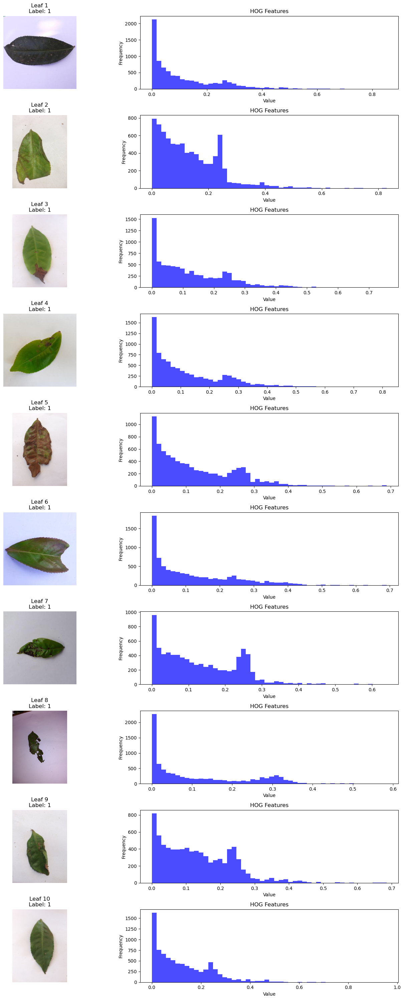

In [51]:
# Randomly select 10 image paths and labels
random_image_paths = np.random.choice(X_test_files, 10, replace=False)
random_labels = y_test[np.array([X_test_files.index(image_path) for image_path in random_image_paths])]

# Extract HOG features and plot leaf images with histograms as subplots
plt.figure(figsize=(15, 30))
for i, image_path in enumerate(random_image_paths, 1):
    # Extract HOG features
    features = extract_hog_features(image_path)
    
    # Plot leaf image
    plt.subplot(10, 2, 2*i-1)
    plt.imshow(imread(image_path), cmap='gray')
    plt.title(f"Leaf {i}\nLabel: {random_labels[i-1]}")
    plt.axis('off')
    
    # Plot histogram of HOG features
    plt.subplot(10, 2, 2*i)
    plt.hist(features, bins=50, color='blue', alpha=0.7)
    plt.title('HOG Features')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


Accuracy: 92.28%
Precision: 0.93
Recall: 0.98
F1-Score: 0.96


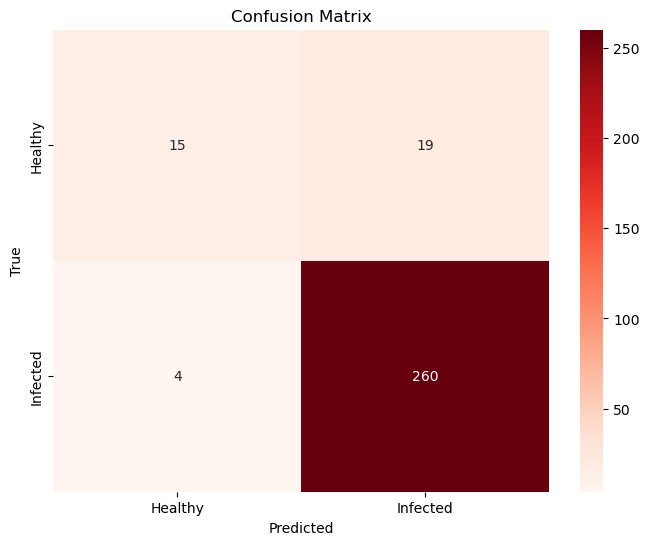

In [52]:
# Initialize the XGBClassifier
clf = XGBClassifier(random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)


# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
labels = ['Healthy', 'Infected']
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Reds', fmt='g', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# LEVEL 2 CLASSIFICATION

In [53]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.feature import hog
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
from sklearn.preprocessing import LabelEncoder
import seaborn as sns


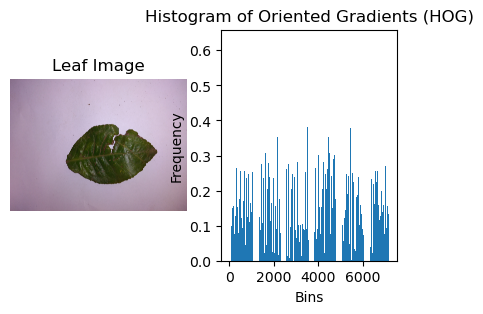

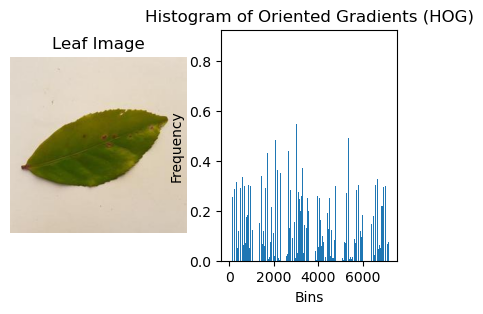

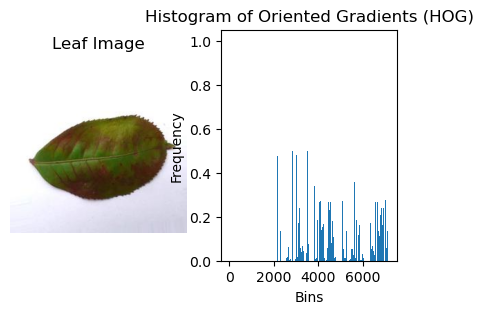

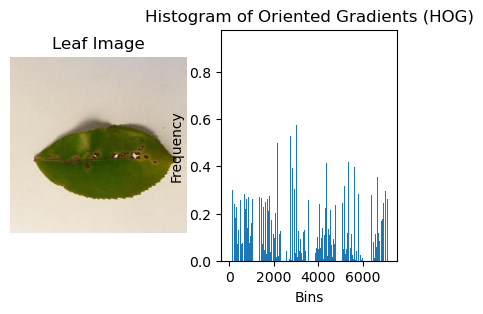

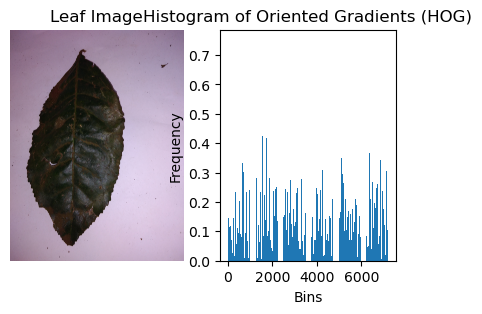

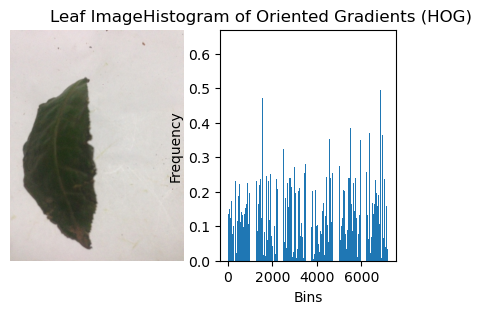

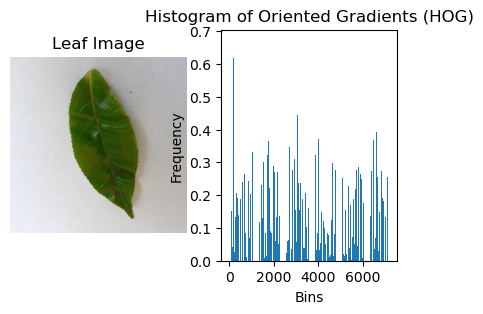

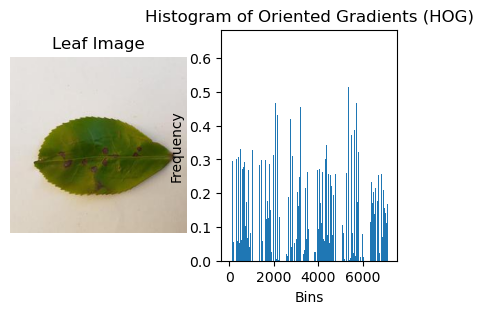

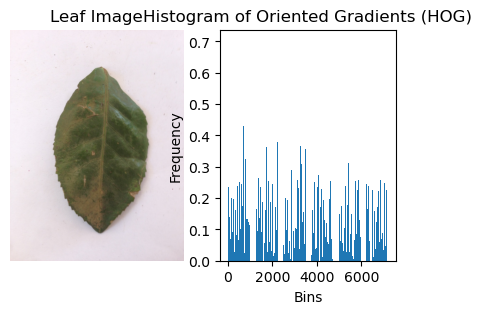

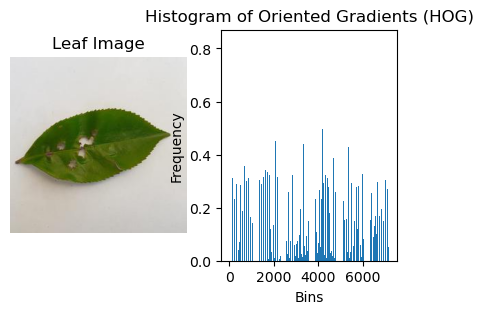

In [54]:

# Function to extract HOG features from an image
def extract_hog_features(image):
    # Ensure image has two spatial dimensions
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize the image if needed
    if image.shape != resize_shape:
        image = cv2.resize(image, resize_shape)
    
    hog_features, _ = hog(image, orientations=8, pixels_per_cell=(8, 8),
                          cells_per_block=(2, 2), visualize=True)
    return hog_features

# Function to load images, resize them, and extract features
def load_images_and_extract_features(disease_paths, resize_shape):
    images = []
    labels = []
    image_paths = []
    for disease, path in disease_paths.items():
        image_files = [f for f in os.listdir(path) if f.endswith('.jpg')]
        for image_name in image_files:
            image_path = os.path.join(path, image_name)
            image = cv2.imread(image_path)
            if image is None:
                print(f"Error reading image: {image_path}")
                continue
            
            hog_features = extract_hog_features(image)
            images.append(hog_features)
            labels.append(disease)
            image_paths.append(image_path)
    return images, labels, image_paths

# Define paths for each disease category
disease_paths = {
    "red leaf spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/red leaf spot",
    "white spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/white spot",
    "algal leaf": "C:/Users/HP/Downloads/tea leaf/categories/infected/algal leaf",
    "gray blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/gray blight",
    "anthracnose": "C:/Users/HP/Downloads/tea leaf/categories/infected/anthracnose",
    "bird eye spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/bird eye spot",
    "brown blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/brown blight",
    "helopeltis": "C:/Users/HP/Downloads/tea leaf/categories/infected/helopeltis"
}

# Define the size to which images will be resized
resize_shape = (128, 128)  # Adjust as needed

# Load images, resize them, and extract features
images, labels, image_paths = load_images_and_extract_features(disease_paths, resize_shape)

# Select 10 random leaf images along with their corresponding HOG features
random_indices = random.sample(range(len(images)), min(10, len(images)))
selected_images = [(images[i], labels[i], image_paths[i]) for i in random_indices]

# Display selected leaf images along with their HOG features
for hog_features, label, image_path in selected_images:
    # Load the corresponding leaf image
    leaf_image = cv2.imread(image_path)
    
    plt.figure(figsize=(5, 3))
    
    # Display the leaf image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(leaf_image, cv2.COLOR_BGR2RGB))
    plt.title('Leaf Image')
    plt.axis('off')
    
    # Display histogram
    plt.subplot(1, 2, 2)
    plt.bar(range(len(hog_features)), hog_features)
    plt.title('Histogram of Oriented Gradients (HOG)')
    plt.xlabel('Bins')
    plt.ylabel('Frequency')
    
    plt.show()


In [55]:
 #Initialize lists to store features and labels
X = []
y = []


# Load images and extract features
for disease, path in disease_paths.items():
    print(f"Processing images for {disease}...")
    for filename in os.listdir(path):
        try:
            if not filename.endswith('.DS_Store'):  # Skip .DS_Store files
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                features = extract_hog_features(image)
                if features is not None:
                    X.append(features)
                    y.append(disease)  # Use disease name as label
        except Exception as e:
            print(f"Error processing image {filename}: {e}")



Processing images for red leaf spot...
Processing images for white spot...
Processing images for algal leaf...
Processing images for gray blight...
Processing images for anthracnose...
Processing images for bird eye spot...
Processing images for brown blight...
Processing images for helopeltis...


In [56]:
# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)


Accuracy: 61.78%
Precision: 62.84%
F1 Score: 61.71%


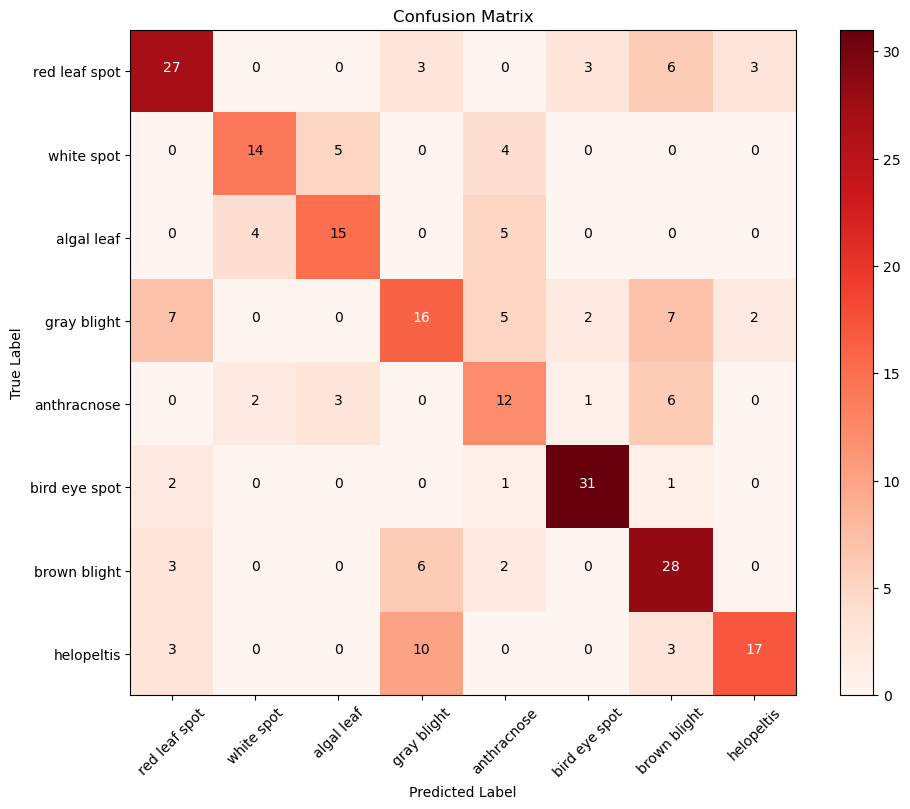

In [57]:
import xgboost as xgb
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

 #Initialize the label encoder
label_encoder = LabelEncoder()

# Fit label encoder and transform the target labels for both training and testing sets
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Initialize the XGBoost Classifier without specifying num_class
xgb_clf = xgb.XGBClassifier(objective='multi:softmax', max_depth=7)

# Train the model
xgb_clf.fit(X_train, y_train_encoded)

# Make predictions on the test data
y_pred_encoded = xgb_clf.predict(X_test)

# Decode the predicted labels back to original class names
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Calculate accuracy in percentage
accuracy = accuracy_score(y_test, y_pred) * 100

# Calculate precision in percentage
precision = precision_score(y_test, y_pred, average='weighted') * 100

# Calculate F1 score in percentage
f1 = f1_score(y_test, y_pred, average='weighted') * 100

print("Accuracy:", "{:.2f}%".format(accuracy))
print("Precision:", "{:.2f}%".format(precision))
print("F1 Score:", "{:.2f}%".format(f1))

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = list(disease_paths.keys())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)

# Display values in each cell
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


#      GBC LBP


# LEVEL 1 CLASIFICATION

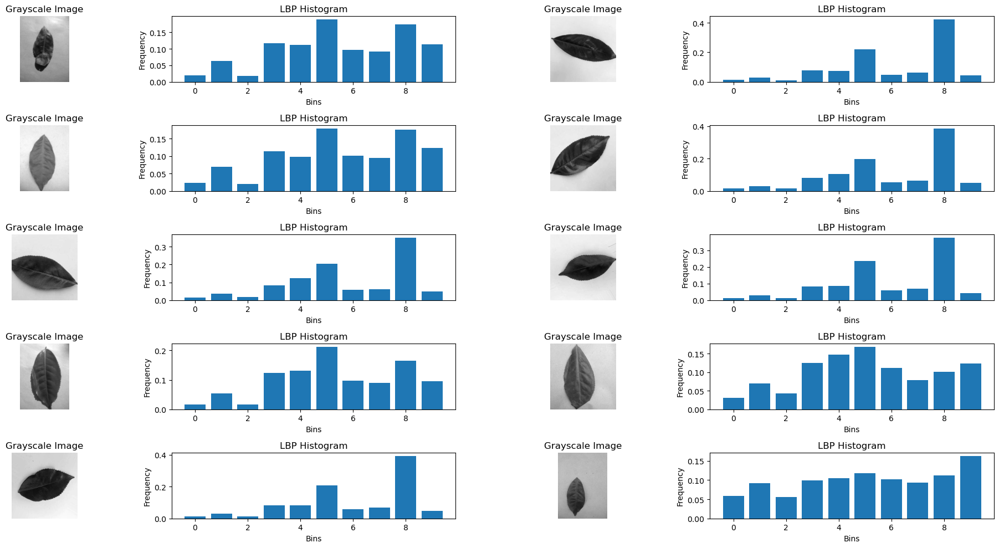

In [58]:
 import os
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from skimage.feature import local_binary_pattern

# Define LBP parameters
radius = 1
n_points = 8 * radius

# Function to extract LBP features and grayscale images
def extract_lbp_features(image_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    

    
    # Check if the image has 2 dimensions
    if len(image.shape) != 2:
        print(f"Error: Invalid image dimensions for {image_path}. Expected 2 dimensions, got {len(image.shape)}.")
        return None, None
    
    # Compute LBP
    lbp = local_binary_pattern(image, n_points, radius, method='uniform')
    
    # Calculate the histogram of LBP and normalize it
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    
    return image, hist

# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Get list of image file paths
image_files = [os.path.join(dataset_directory, folder, filename) for folder in os.listdir(dataset_directory) for filename in os.listdir(os.path.join(dataset_directory, folder))]

# Choose 10 random images
random_image_files = np.random.choice(image_files, 10, replace=False)

# Extract features and images for visualization
visualize_images = [extract_lbp_features(image_file) for image_file in random_image_files]

# Filter out invalid images
visualize_images = [(image, hist) for image, hist in visualize_images if image is not None and hist is not None]

# Plot grayscale images and histograms
plt.figure(figsize=(20, 10))
for i, (image, hist) in enumerate(visualize_images):
    plt.subplot(5, 4, i*2+1)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title('Grayscale Image')
    
    plt.subplot(5, 4, i*2+2)
    plt.bar(np.arange(len(hist)), hist)
    plt.title('LBP Histogram')
    plt.xlabel('Bins')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [59]:
# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Specify image preprocessing parameters
target_width = 224
target_height = 224
batch_size = 32

# Image data generator for preprocessing and data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    dataset_directory,
    target_size=(target_width, target_height),
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=True,  
    seed=42
)

class_mapping = train_generator.class_indices
class_counts = {class_label: sum(train_generator.classes == class_index) for class_label, class_index in class_mapping.items()}


for class_label, count in class_counts.items():
    print(f'{class_label}: {count} samples')

# Convert labels to binary: 1 for infected, 0 for healthy
labels = (train_generator.classes == class_mapping["infected"]).astype(int)

# Split the dataset into training and testing sets
X_train_files, X_test_files, y_train, y_test = train_test_split(train_generator.filepaths, labels, test_size=0.2, random_state=42)

# Check for imbalance
unique_classes, class_counts = np.unique(y_train, return_counts=True)
if len(unique_classes) < 2:
    raise ValueError("Dataset is imbalanced. Minimum of 2 classes are required.")


Found 1489 images belonging to 2 classes.
healthy: 197 samples
infected: 1292 samples


In [60]:
# Extract LBP features for training data
X_train = []
for image_path in X_train_files:
    image, hist = extract_lbp_features(image_path)
    if hist is not None:
        X_train.append(hist)
    else:
        print(f"Error: Unable to extract LBP features for {image_path}")

# Convert to numpy array
X_train = np.array(X_train)


In [61]:
# Extract LBP features for testing data
X_test = []
for image_path in X_test_files:
    image, hist = extract_lbp_features(image_path)
    if hist is not None:
        X_test.append(hist)
    else:
        print(f"Error: Unable to extract LBP features for {image_path}")

# Convert to numpy array
X_test = np.array(X_test)


In [62]:
# Initialize the GradientBoostingClassifier
clf = GradientBoostingClassifier(random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)


Accuracy: 91.95%
Precision: 0.94
Recall: 0.97
F1-Score: 0.96


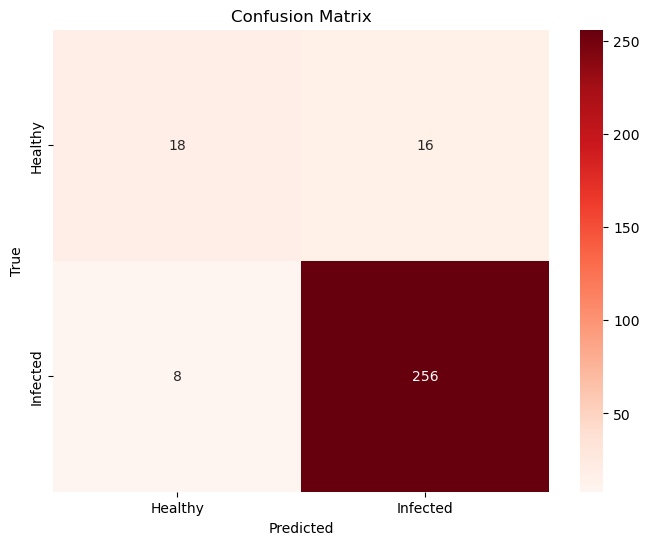

In [63]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

# Calculate F1-score
f1 = f1_score(y_test, y_pred)

# Print accuracy, precision, recall, and F1-score
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
labels = ['Healthy', 'Infected']
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Reds', fmt='g', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# LEVEL 2 CLASSIFICATION

Disease: red leaf spot, Image: UNADJUSTEDNONRAW_thumb_1a3.jpg


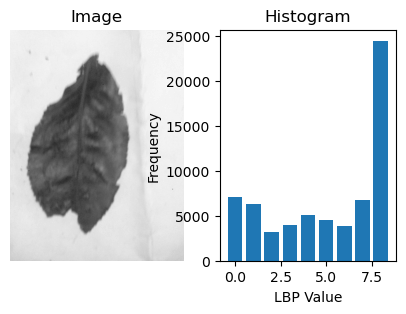


Disease: red leaf spot, Image: UNADJUSTEDNONRAW_thumb_1fe.jpg


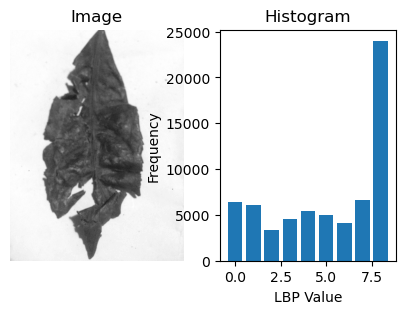


Disease: white spot, Image: UNADJUSTEDNONRAW_thumb_e7.jpg


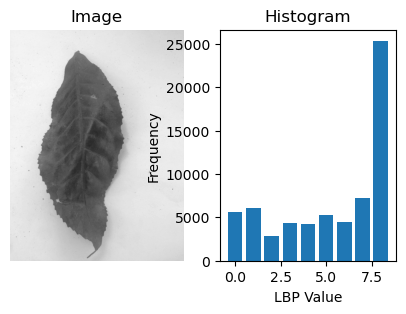


Disease: white spot, Image: UNADJUSTEDNONRAW_thumb_b8.jpg


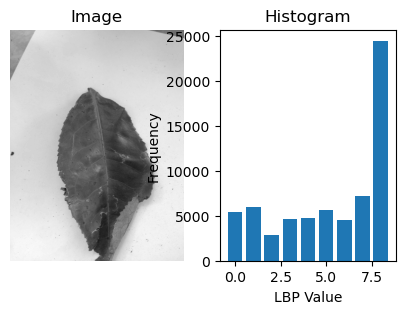


Disease: algal leaf, Image: UNADJUSTEDNONRAW_thumb_c.jpg


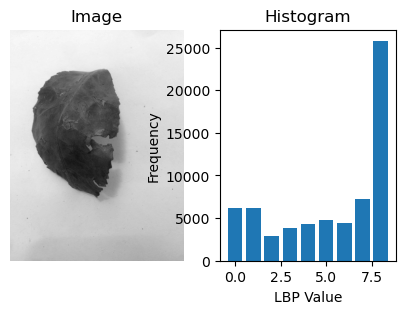


Disease: algal leaf, Image: 20211226_102316.jpg


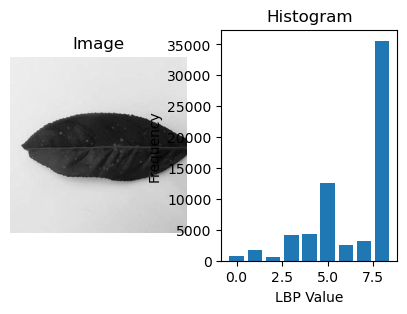


Disease: red leaf spot, Image: image_0_57.jpg


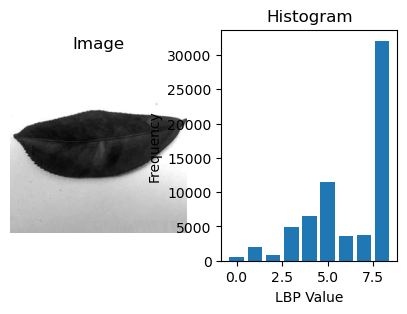


Disease: gray blight, Image: IMG_20220503_140613.jpg


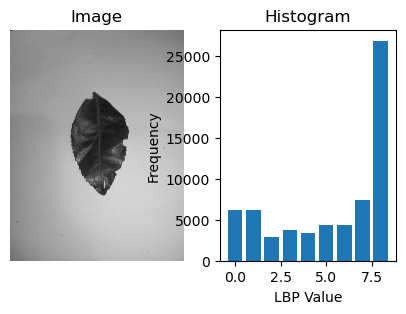


Disease: anthracnose, Image: IMG_20220503_143525.jpg


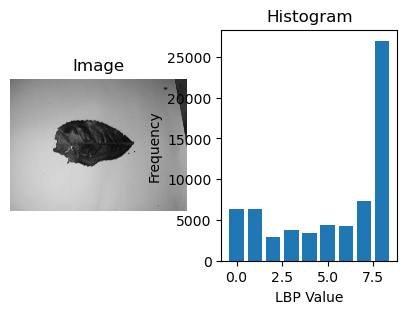


Disease: anthracnose, Image: IMG_20220503_144927.jpg


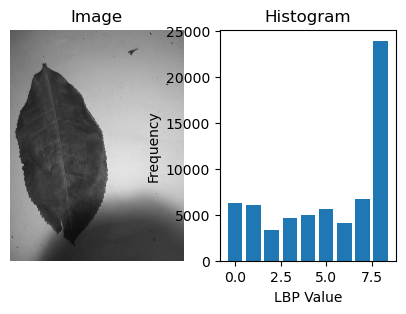


Disease: bird eye spot, Image: IMG_20220503_154153.jpg


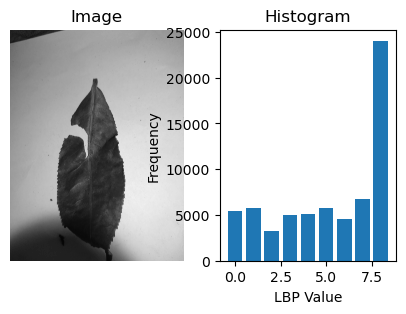


Disease: bird eye spot, Image: IMG_20220503_155014.jpg


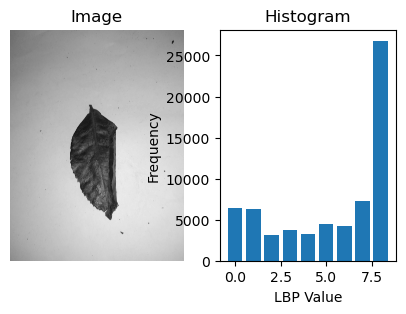


Disease: red leaf spot, Image: image_0_925.jpg


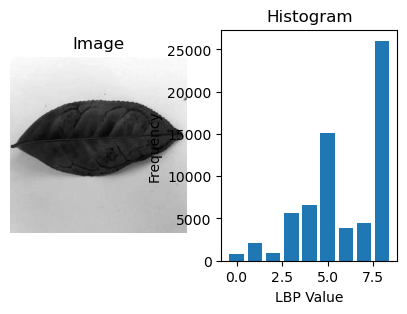


Disease: brown blight, Image: UNADJUSTEDNONRAW_thumb_14a.jpg


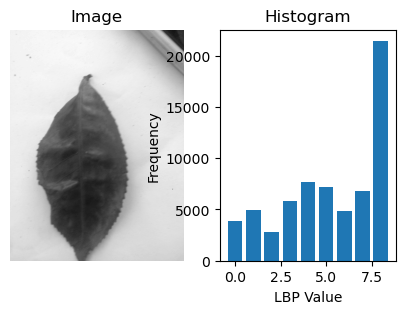


Disease: helopeltis, Image: 20220101_094321.jpg


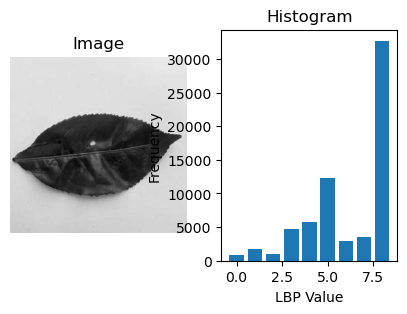


Disease: helopeltis, Image: 20211205_161003.jpg


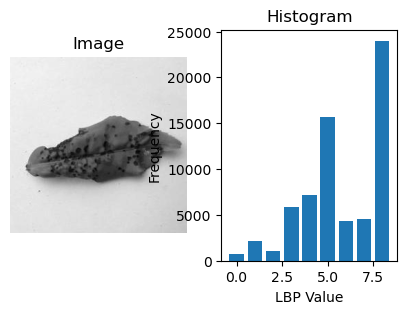

In [64]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from skimage.feature import local_binary_pattern
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt

# Function to extract LBP features from an image
def extract_lbp_features(image):
    # Resize the image to a smaller size
    resized_image = cv2.resize(image, (256, 256))
    # Compute LBP
    lbp = local_binary_pattern(resized_image, 8, 1, method='uniform')
    # Calculate histogram of LBP
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 10), range=(0, 9))
    return hist


# Function to display an image along with its histogram
def display_image_with_histogram(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    lbp_features = extract_lbp_features(image)

    plt.figure(figsize=(5, 3))

    # Plot the image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Image')
    plt.axis('off')

    # Plot the histogram
    plt.subplot(1, 2, 2)
    plt.bar(range(len(lbp_features)), lbp_features)
    plt.title('Histogram')
    plt.xlabel('LBP Value')
    plt.ylabel('Frequency')

    plt.show()

# Define paths for each disease category
disease_paths = {
    "red leaf spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/red leaf spot",
    "white spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/white spot",
    "algal leaf": "C:/Users/HP/Downloads/tea leaf/categories/infected/algal leaf",
    "gray blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/gray blight",
    "anthracnose": "C:/Users/HP/Downloads/tea leaf/categories/infected/anthracnose",
    "bird eye spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/bird eye spot",
    "brown blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/brown blight",
    "helopeltis": "C:/Users/HP/Downloads/tea leaf/categories/infected/helopeltis"
}

# Define the number of random images to display
num_images = 2

# Randomly select images from all paths
random_images = []
for disease, path in disease_paths.items():
    image_files = [f for f in os.listdir(path) if f.endswith('.jpg')]
    random_images.extend(random.sample(image_files, min(num_images, len(image_files))))

# Display the random images along with their histograms
for image_name in random_images:
    for disease, path in disease_paths.items():
        if image_name in os.listdir(path):
            image_path = os.path.join(path, image_name)
            print(f"Disease: {disease}, Image: {image_name}")
            display_image_with_histogram(image_path)
            print()
            break  # Stop searching in other paths once the image is found


In [65]:
 #Initialize lists to store features and labels
X = []
y = []



In [66]:
# Load images and extract features
for disease, path in disease_paths.items():
    print(f"Processing images for {disease}...")
    for filename in os.listdir(path):
        try:
            if not filename.endswith('.DS_Store'):  # Skip .DS_Store files
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                features = extract_lbp_features(image)
                if features is not None:
                    X.append(features)
                    y.append(disease)  # Use disease name as label
        except Exception as e:
            print(f"Error processing image {filename}: {e}")



Processing images for red leaf spot...
Processing images for white spot...
Processing images for algal leaf...
Processing images for gray blight...
Processing images for anthracnose...
Processing images for bird eye spot...
Processing images for brown blight...
Processing images for helopeltis...


In [67]:


# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Gradient Boosting Classifier
gbc = GradientBoostingClassifier()

# Train the model
gbc.fit(X_train, y_train)

# Make predictions on the test data
y_pred = gbc.predict(X_test)


# Calculate accuracy in percentage
accuracy = accuracy_score(y_test, y_pred) * 100

# Calculate precision in percentage
precision = precision_score(y_test, y_pred, average='weighted') * 100

# Calculate F1 score in percentage
f1 = f1_score(y_test, y_pred, average='weighted') * 100

print("Accuracy:", "{:.2f}%".format(accuracy))
print("Precision:", "{:.2f}%".format(precision))
print("F1 Score:", "{:.2f}%".format(f1))


Accuracy: 55.98%
Precision: 55.59%
F1 Score: 55.30%


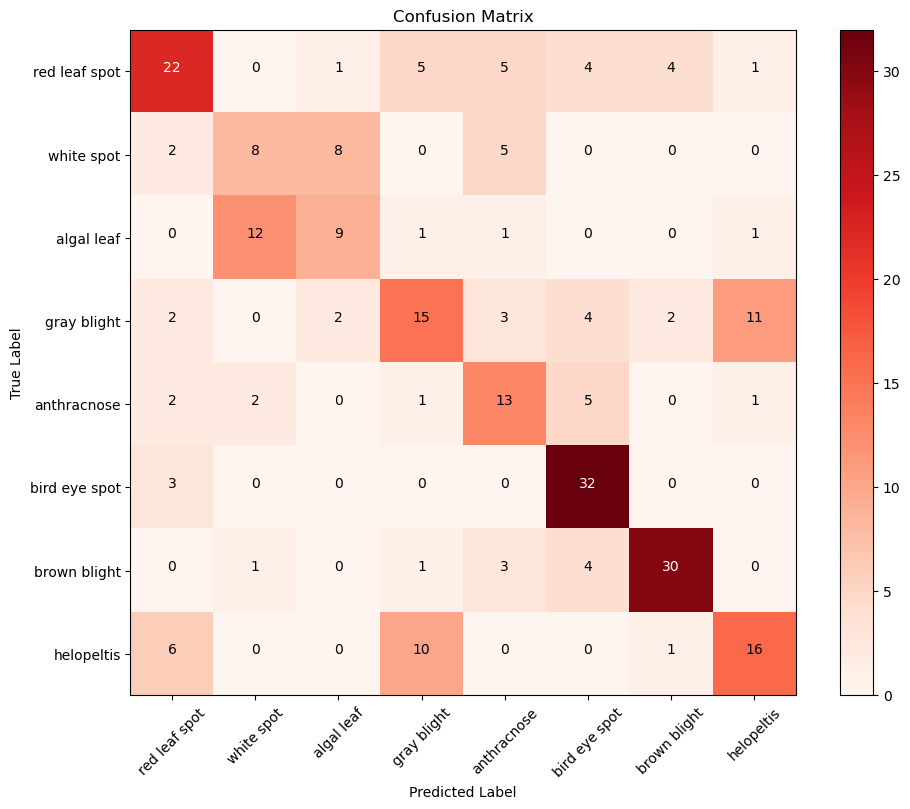

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = list(disease_paths.keys())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)

# Display values in each cell
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# GBC HOG

# LEVEL 1 CLASIFICATION

In [69]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.feature import hog


In [71]:
from skimage.io import imread
from skimage.transform import resize
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [72]:
# Function to extract HOG features from an image
def extract_hog_features(image_path):
    # Read the image
    image = imread(image_path, as_gray=True)
    
    # Resize image to a fixed size (e.g., 128x128)
    resized_image = resize(image, (128, 128))
    
    # Compute HOG features
    features = hog(resized_image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys', visualize=False, multichannel=False)
    
    return features



In [73]:
# Path to the dataset
dataset_directory ="C:/Users/HP/Downloads/tea leaf/categories"
# Specify image preprocessing parameters
target_width = 128
target_height = 128
batch_size = 32



# Image data generator for preprocessing and data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    dataset_directory,
    target_size=(target_width, target_height),
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=True,  
    seed=42
)


class_mapping = train_generator.class_indices
class_counts = {class_label: sum(train_generator.classes == class_index) for class_label, class_index in class_mapping.items()}
for class_label, count in class_counts.items():
    print(f'{class_label}: {count} samples')




Found 1489 images belonging to 2 classes.
healthy: 197 samples
infected: 1292 samples


In [74]:
# Convert labels to binary: 1 for infected, 0 for healthy
labels = (train_generator.classes == class_mapping["infected"]).astype(int)



# Split the dataset into training and testing sets
X_train_files, X_test_files, y_train, y_test = train_test_split(train_generator.filepaths, labels, test_size=0.2, random_state=42)


In [75]:
from skimage.feature import hog
from skimage.transform import resize

def extract_hog_features(image_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Check if the image is valid
    if image is None:
        print(f"Error loading image: {image_path}")
        return None
    
    # Resize the image
    resized_image = resize(image, (128, 128))
    
    # Compute HOG features
    features = hog(resized_image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys')
    
    return features


In [76]:
import cv2
# Extract HOG features for training data
X_train = np.array([extract_hog_features(image_path) for image_path in X_train_files])

# Extract HOG features for testing data
X_test = np.array([extract_hog_features(image_path) for image_path in X_test_files])


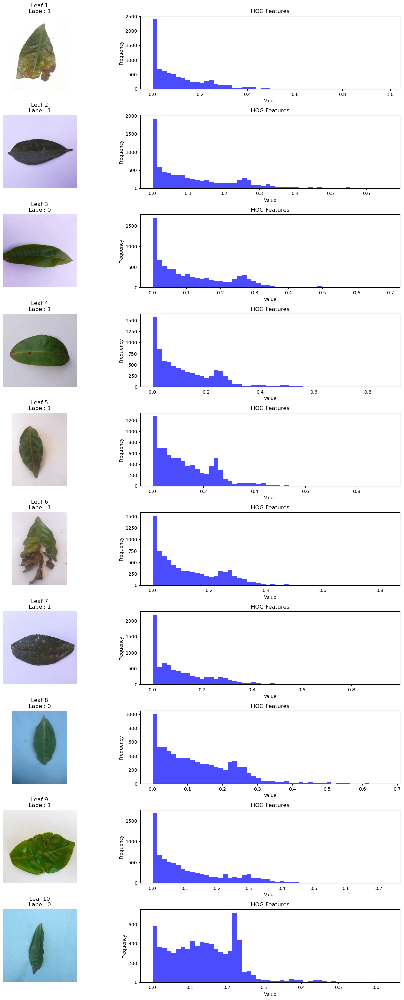

In [77]:
# Randomly select 10 image paths and labels
random_image_paths = np.random.choice(X_test_files, 10, replace=False)
random_labels = y_test[np.array([X_test_files.index(image_path) for image_path in random_image_paths])]

# Extract HOG features and plot leaf images with histograms as subplots
plt.figure(figsize=(15, 30))
for i, image_path in enumerate(random_image_paths, 1):
    # Extract HOG features
    features = extract_hog_features(image_path)
    
    # Plot leaf image
    plt.subplot(10, 2, 2*i-1)
    plt.imshow(imread(image_path), cmap='gray')
    plt.title(f"Leaf {i}\nLabel: {random_labels[i-1]}")
    plt.axis('off')
    
    # Plot histogram of HOG features
    plt.subplot(10, 2, 2*i)
    plt.hist(features, bins=50, color='blue', alpha=0.7)
    plt.title('HOG Features')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


Accuracy: 89.60%
Precision: 0.91
Recall: 0.98
F1-Score: 0.94


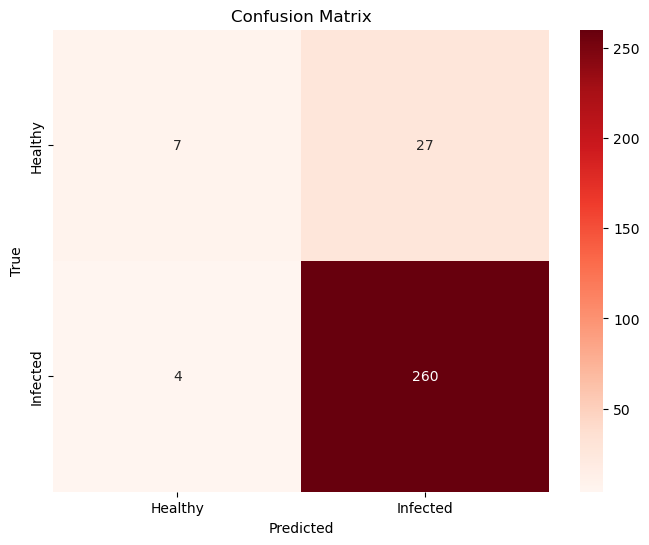

In [78]:
# Initialize the GradientBoostingClassifier
clf = GradientBoostingClassifier(random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
labels = ['Healthy', 'Infected']
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Reds', fmt='g', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# LEVEL 2 CLASSIFICATION

In [79]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.feature import hog
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
from sklearn.preprocessing import LabelEncoder
import seaborn as sns


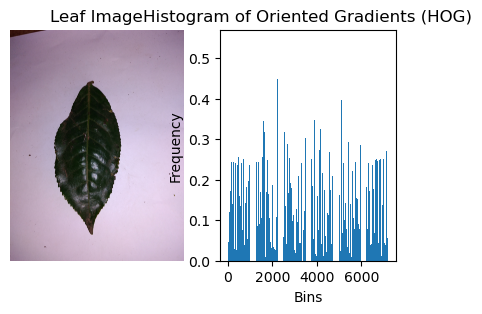

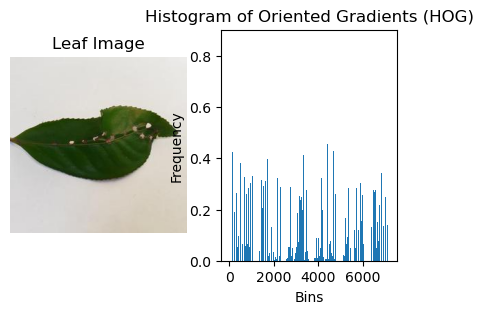

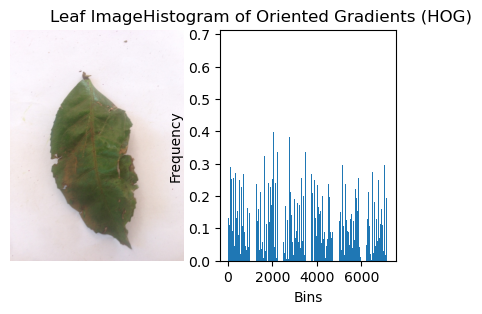

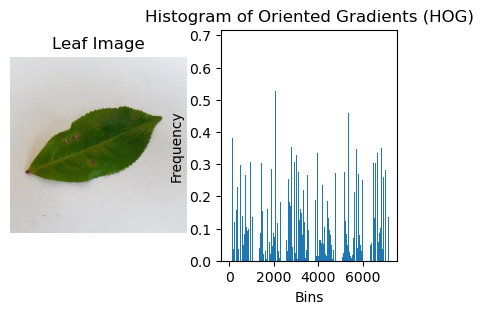

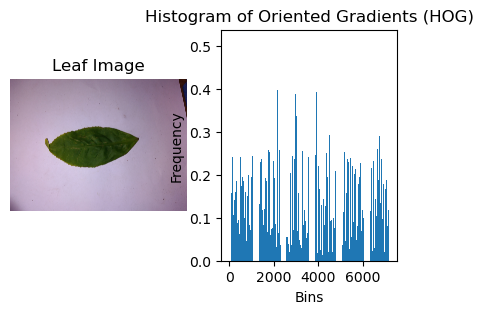

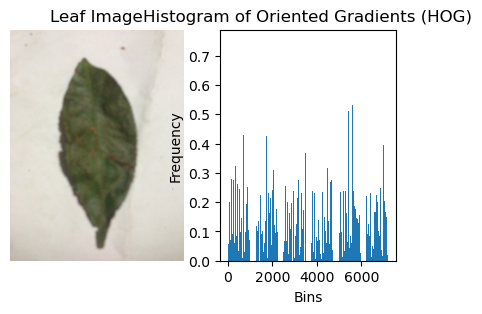

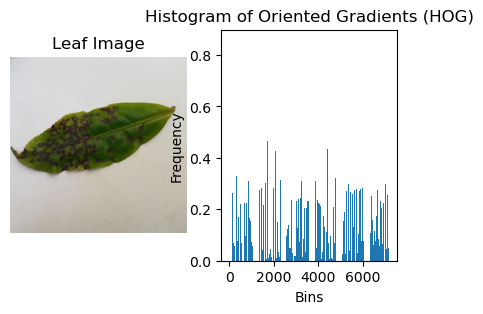

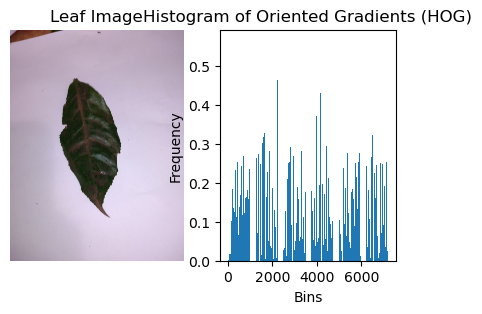

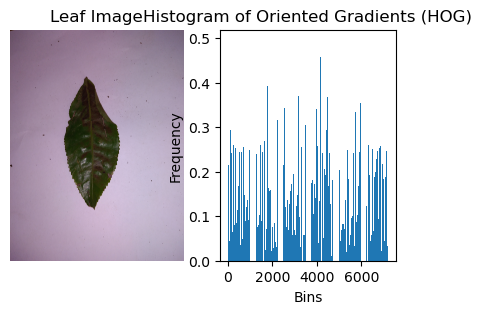

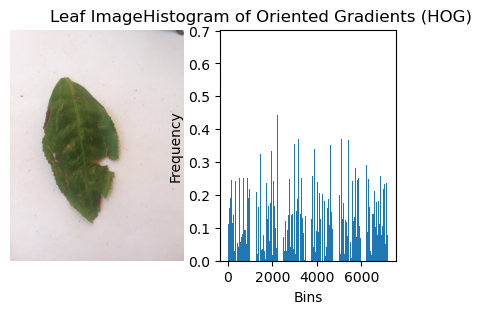

In [80]:

# Function to extract HOG features from an image
def extract_hog_features(image):
    # Ensure image has two spatial dimensions
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize the image if needed
    if image.shape != resize_shape:
        image = cv2.resize(image, resize_shape)
    
    hog_features, _ = hog(image, orientations=8, pixels_per_cell=(8, 8),
                          cells_per_block=(2, 2), visualize=True)
    return hog_features

# Function to load images, resize them, and extract features
def load_images_and_extract_features(disease_paths, resize_shape):
    images = []
    labels = []
    image_paths = []
    for disease, path in disease_paths.items():
        image_files = [f for f in os.listdir(path) if f.endswith('.jpg')]
        for image_name in image_files:
            image_path = os.path.join(path, image_name)
            image = cv2.imread(image_path)
            if image is None:
                print(f"Error reading image: {image_path}")
                continue
            
            hog_features = extract_hog_features(image)
            images.append(hog_features)
            labels.append(disease)
            image_paths.append(image_path)
    return images, labels, image_paths

# Define paths for each disease category
disease_paths = {
    "red leaf spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/red leaf spot",
    "white spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/white spot",
    "algal leaf": "C:/Users/HP/Downloads/tea leaf/categories/infected/algal leaf",
    "gray blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/gray blight",
    "anthracnose": "C:/Users/HP/Downloads/tea leaf/categories/infected/anthracnose",
    "bird eye spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/bird eye spot",
    "brown blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/brown blight",
    "helopeltis": "C:/Users/HP/Downloads/tea leaf/categories/infected/helopeltis"
}

# Define the size to which images will be resized
resize_shape = (128, 128)  # Adjust as needed

# Load images, resize them, and extract features
images, labels, image_paths = load_images_and_extract_features(disease_paths, resize_shape)

# Select 10 random leaf images along with their corresponding HOG features
random_indices = random.sample(range(len(images)), min(10, len(images)))
selected_images = [(images[i], labels[i], image_paths[i]) for i in random_indices]

# Display selected leaf images along with their HOG features
for hog_features, label, image_path in selected_images:
    # Load the corresponding leaf image
    leaf_image = cv2.imread(image_path)
    
    plt.figure(figsize=(5, 3))
    
    # Display the leaf image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(leaf_image, cv2.COLOR_BGR2RGB))
    plt.title('Leaf Image')
    plt.axis('off')
    
    # Display histogram
    plt.subplot(1, 2, 2)
    plt.bar(range(len(hog_features)), hog_features)
    plt.title('Histogram of Oriented Gradients (HOG)')
    plt.xlabel('Bins')
    plt.ylabel('Frequency')
    
    plt.show()


In [81]:
 #Initialize lists to store features and labels
X = []
y = []


In [82]:
# Load images and extract features
for disease, path in disease_paths.items():
    print(f"Processing images for {disease}...")
    for filename in os.listdir(path):
        try:
            if not filename.endswith('.DS_Store'):  # Skip .DS_Store files
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                features = extract_hog_features(image)
                if features is not None:
                    X.append(features)
                    y.append(disease)  # Use disease name as label
        except Exception as e:
            print(f"Error processing image {filename}: {e}")



Processing images for red leaf spot...
Processing images for white spot...
Processing images for algal leaf...
Processing images for gray blight...
Processing images for anthracnose...
Processing images for bird eye spot...
Processing images for brown blight...
Processing images for helopeltis...


In [83]:
# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)


In [84]:

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)




In [85]:
# Initialize the Gradient Boosting Classifier
gbc = GradientBoostingClassifier()


In [90]:

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reduce dimensionality
pca = PCA(n_components=0.95)  # Keep 95% of variance
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Define Gradient Boosting Classifier with optimized parameters
gbc = GradientBoostingClassifier(
    n_estimators=100,       # Reduce number of trees
    learning_rate=0.1,      # Increase learning rate
    max_depth=3,            # Reduce depth of trees
    random_state=42
)

# Train the model
gbc.fit(X_train_pca, y_train)

# Evaluate the model
y_pred = gbc.predict(X_test_pca)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.53


Accuracy: 52.90%
Precision: 55.24%
F1 Score: 52.60%


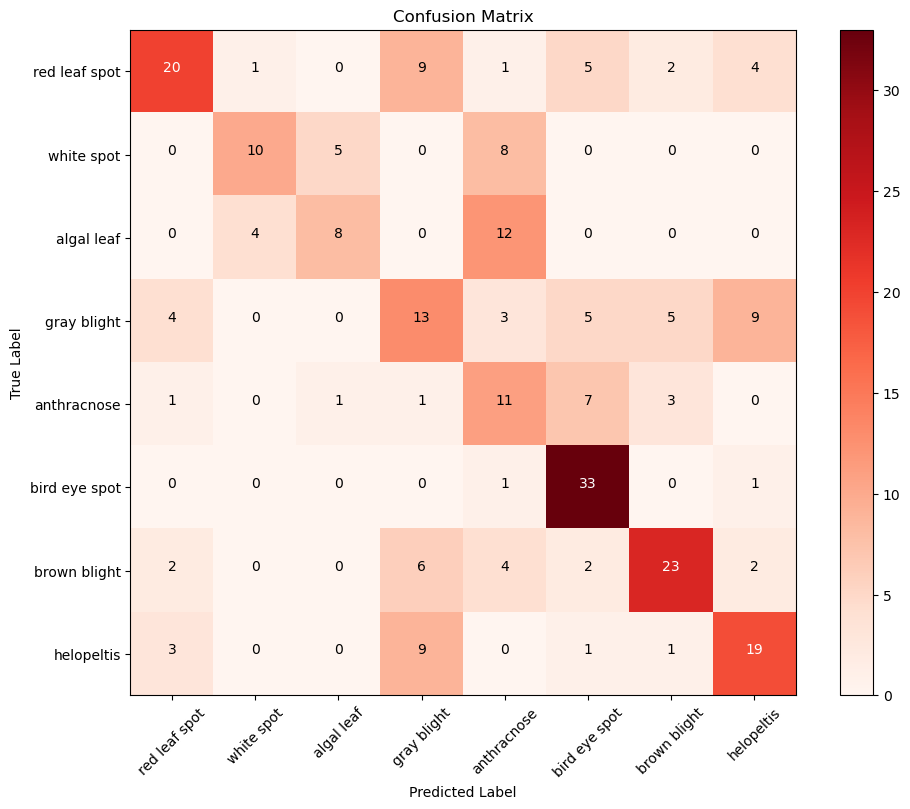

In [91]:


# Calculate accuracy in percentage
accuracy = accuracy_score(y_test, y_pred) * 100

# Calculate precision in percentage
precision = precision_score(y_test, y_pred, average='weighted') * 100

# Calculate F1 score in percentage
f1 = f1_score(y_test, y_pred, average='weighted') * 100

print("Accuracy:", "{:.2f}%".format(accuracy))
print("Precision:", "{:.2f}%".format(precision))
print("F1 Score:", "{:.2f}%".format(f1))


import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = list(disease_paths.keys())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)

# Display values in each cell
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


#                                         LIGHT GBM LBP

# LEVEL 1 CLASSIFICATION

In [92]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


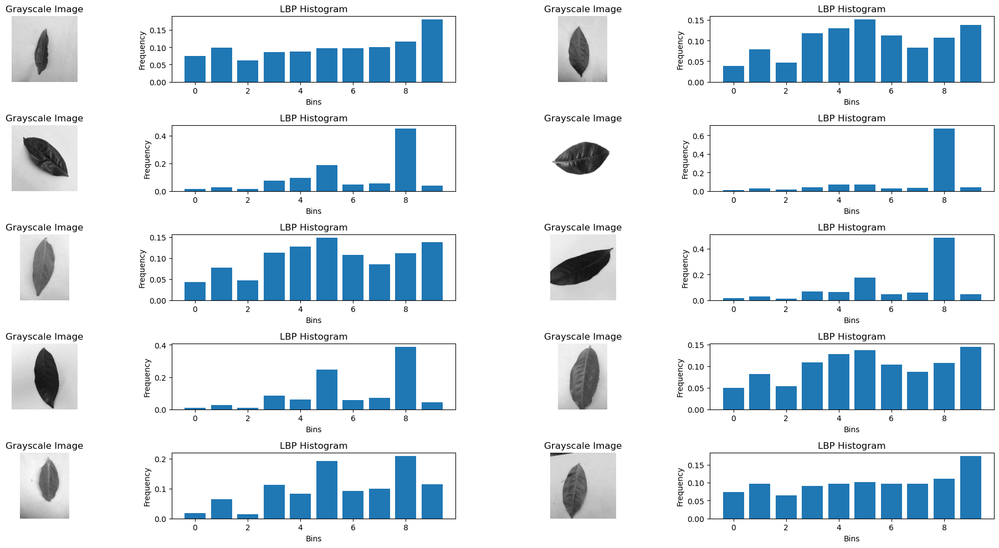

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from skimage.feature import local_binary_pattern

# Define LBP parameters
radius = 1
n_points = 8 * radius

def extract_lbp_features(image_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Check if the image is valid
    if image is None:
        print(f"Invalid image: {image_path}")
        return None, None

    # Compute LBP
    lbp = local_binary_pattern(image, n_points, radius, method='uniform')
    
    # Calculate the histogram of LBP and normalize it
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    
    return image, hist


# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Get list of image file paths
image_files = [os.path.join(dataset_directory, folder, filename) for folder in os.listdir(dataset_directory) for filename in os.listdir(os.path.join(dataset_directory, folder))]

# Choose 10 random images
random_image_files = np.random.choice(image_files, 10, replace=False)

# Extract features and images for visualization
visualize_images = [extract_lbp_features(image_file) for image_file in random_image_files]

# Filter out invalid images
visualize_images = [(image, hist) for image, hist in visualize_images if image is not None and hist is not None]

# Plot grayscale images and histograms
plt.figure(figsize=(20, 10))
for i, (image, hist) in enumerate(visualize_images):
    plt.subplot(5, 4, i*2+1)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title('Grayscale Image')
    
    plt.subplot(5, 4, i*2+2)
    plt.bar(np.arange(len(hist)), hist)
    plt.title('LBP Histogram')
    plt.xlabel('Bins')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [94]:
# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Specify image preprocessing parameters
target_width = 224
target_height = 224
batch_size = 32

# Image data generator for preprocessing and data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    dataset_directory,
    target_size=(target_width, target_height),
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=True,  
    seed=42
)

class_mapping = train_generator.class_indices
class_counts = {class_label: sum(train_generator.classes == class_index) for class_label, class_index in class_mapping.items()}


for class_label, count in class_counts.items():
    print(f'{class_label}: {count} samples')

# Convert labels to binary: 1 for infected, 0 for healthy
labels = (train_generator.classes == class_mapping["infected"]).astype(int)

# Split the dataset into training and testing sets
X_train_files, X_test_files, y_train, y_test = train_test_split(train_generator.filepaths, labels, test_size=0.2, random_state=42)

# Check for imbalance
unique_classes, class_counts = np.unique(y_train, return_counts=True)
if len(unique_classes) < 2:
    raise ValueError("Dataset is imbalanced. Minimum of 2 classes are required.")


Found 1489 images belonging to 2 classes.
healthy: 197 samples
infected: 1292 samples


In [95]:
# Extract LBP features for training data
X_train = []
for image_path in X_train_files:
    image, hist = extract_lbp_features(image_path)
    if hist is not None:
        X_train.append(hist)
    else:
        print(f"Error: Unable to extract LBP features for {image_path}")

# Convert to numpy array
X_train = np.array(X_train)


In [96]:
# Extract LBP features for testing data
X_test = []
for image_path in X_test_files:
    image, hist = extract_lbp_features(image_path)
    if hist is not None:
        X_test.append(hist)
    else:
        print(f"Error: Unable to extract LBP features for {image_path}")

# Convert to numpy array
X_test = np.array(X_test)


In [97]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize the LightGBM Classifier with custom parameters
lgb_clf = LGBMClassifier(num_leaves=2, objective='binary', force_col_wise=True, random_state=4)

# Train the model
lgb_clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = lgb_clf.predict(X_test)



[LightGBM] [Info] Number of positive: 1028, number of negative: 163
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 1191, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.863140 -> initscore=1.841620
[LightGBM] [Info] Start training from score 1.841620


Accuracy: 92.95%
Precision: 0.94
Recall: 0.99
F1-Score: 0.96


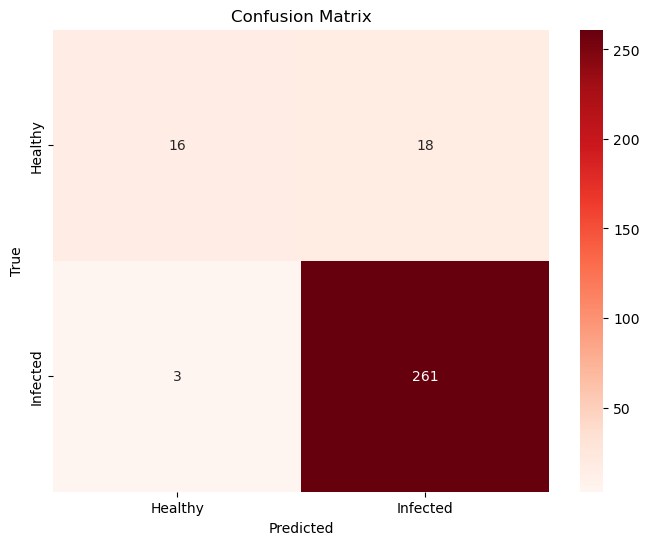

In [98]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

# Calculate F1-score
f1 = f1_score(y_test, y_pred)

# Print accuracy, precision, recall, and F1-score
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
labels = ['Healthy', 'Infected']
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Reds', fmt='g', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# LEVEL 2 CLASSIFICATION

Disease: red leaf spot, Image: UNADJUSTEDNONRAW_thumb_18d.jpg


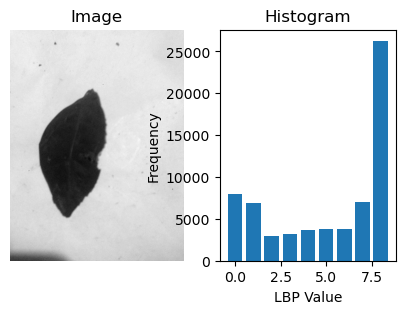


Disease: red leaf spot, Image: UNADJUSTEDNONRAW_thumb_19a.jpg


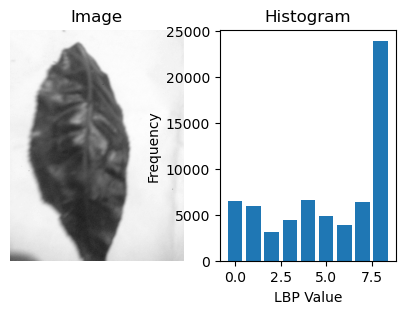


Disease: white spot, Image: UNADJUSTEDNONRAW_thumb_cc.jpg


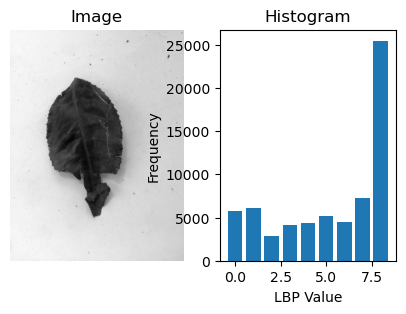


Disease: white spot, Image: UNADJUSTEDNONRAW_thumb_8e.jpg


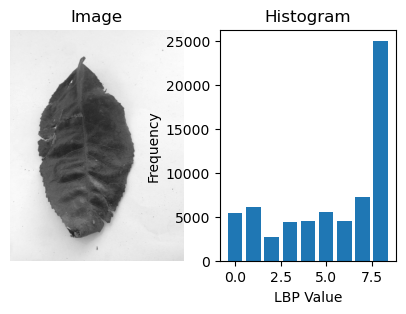


Disease: algal leaf, Image: 20211227_102403.jpg


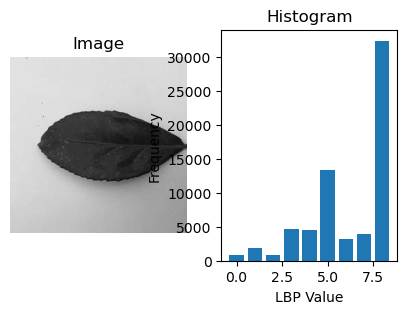


Disease: algal leaf, Image: UNADJUSTEDNONRAW_thumb_2b.jpg


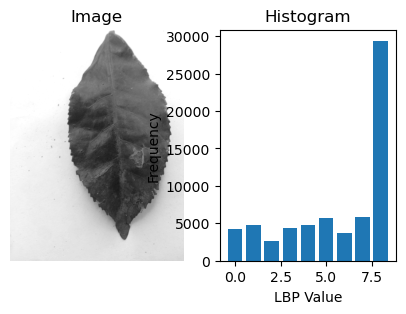


Disease: gray blight, Image: IMG_20220503_135816.jpg


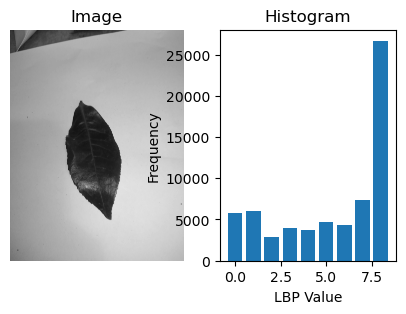


Disease: gray blight, Image: IMG_20220503_140011.jpg


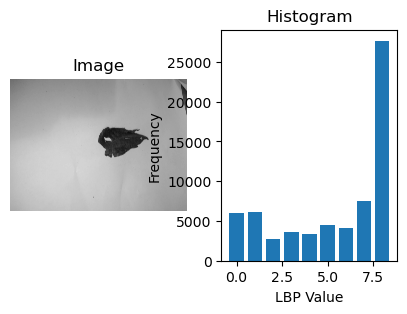


Disease: anthracnose, Image: IMG_20220503_143336.jpg


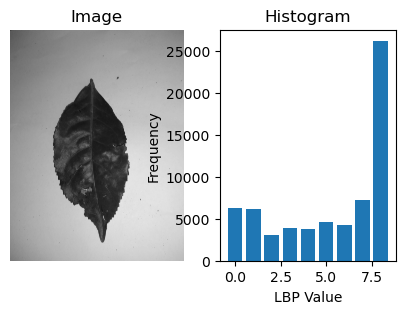


Disease: anthracnose, Image: IMG_20220503_145801.jpg


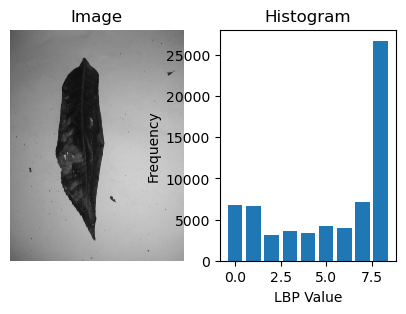


Disease: bird eye spot, Image: IMG_20220503_155641.jpg


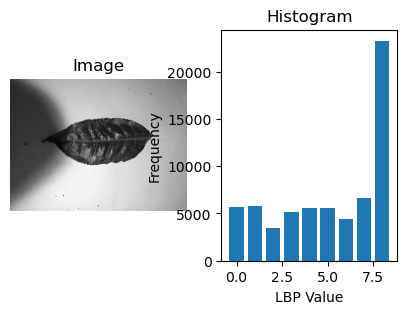


Disease: bird eye spot, Image: IMG_20220503_154813.jpg


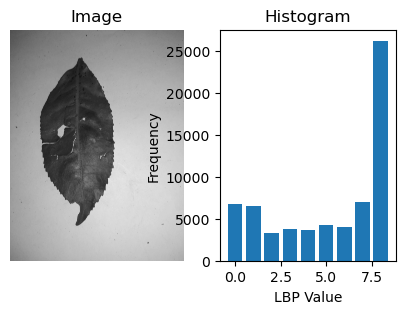


Disease: brown blight, Image: UNADJUSTEDNONRAW_thumb_112.jpg


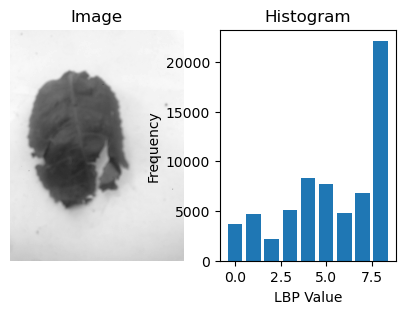


Disease: brown blight, Image: UNADJUSTEDNONRAW_thumb_10e.jpg


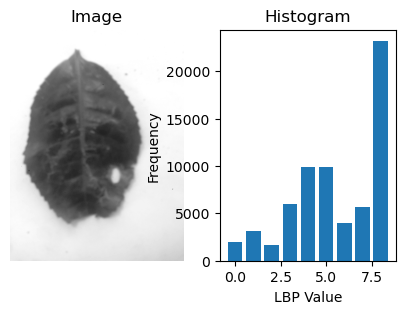


Disease: helopeltis, Image: 20220101_094158.jpg


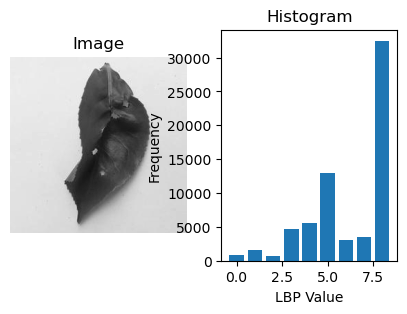


Disease: helopeltis, Image: 20220101_102559.jpg


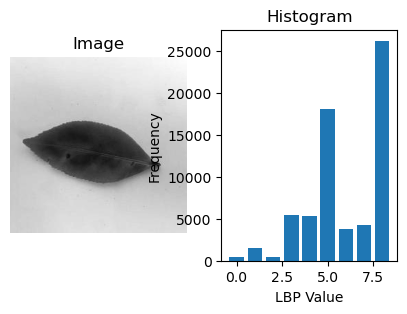

In [99]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import lightgbm as lgb
from skimage.feature import local_binary_pattern
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt

# Function to extract LBP features from an image
def extract_lbp_features(image):
    # Resize the image to a smaller size
    resized_image = cv2.resize(image, (256, 256))
    # Compute LBP
    lbp = local_binary_pattern(resized_image, 8, 1, method='uniform')
    # Calculate histogram of LBP
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 10), range=(0, 9))
    return hist


# Function to display an image along with its histogram
def display_image_with_histogram(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    lbp_features = extract_lbp_features(image)

    plt.figure(figsize=(5, 3))

    # Plot the image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Image')
    plt.axis('off')

    # Plot the histogram
    plt.subplot(1, 2, 2)
    plt.bar(range(len(lbp_features)), lbp_features)
    plt.title('Histogram')
    plt.xlabel('LBP Value')
    plt.ylabel('Frequency')

    plt.show()

# Define paths for each disease category
disease_paths = {
    "red leaf spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/red leaf spot",
    "white spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/white spot",
    "algal leaf": "C:/Users/HP/Downloads/tea leaf/categories/infected/algal leaf",
    "gray blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/gray blight",
    "anthracnose": "C:/Users/HP/Downloads/tea leaf/categories/infected/anthracnose",
    "bird eye spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/bird eye spot",
    "brown blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/brown blight",
    "helopeltis": "C:/Users/HP/Downloads/tea leaf/categories/infected/helopeltis"
}

# Define the number of random images to display
num_images = 2

# Randomly select images from all paths
random_images = []
for disease, path in disease_paths.items():
    image_files = [f for f in os.listdir(path) if f.endswith('.jpg')]
    random_images.extend(random.sample(image_files, min(num_images, len(image_files))))

# Display the random images along with their histograms
for image_name in random_images:
    for disease, path in disease_paths.items():
        if image_name in os.listdir(path):
            image_path = os.path.join(path, image_name)
            print(f"Disease: {disease}, Image: {image_name}")
            display_image_with_histogram(image_path)
            print()
            break  # Stop searching in other paths once the image is found


In [100]:
 #Initialize lists to store features and labels
X = []
y = []



In [101]:
# Load images and extract features
for disease, path in disease_paths.items():
    print(f"Processing images for {disease}...")
    for filename in os.listdir(path):
        try:
            if not filename.endswith('.DS_Store'):  # Skip .DS_Store files
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                features = extract_lbp_features(image)
                if features is not None:
                    X.append(features)
                    y.append(disease)  # Use disease name as label
        except Exception as e:
            print(f"Error processing image {filename}: {e}")



Processing images for red leaf spot...
Processing images for white spot...
Processing images for algal leaf...
Processing images for gray blight...
Processing images for anthracnose...
Processing images for bird eye spot...
Processing images for brown blight...
Processing images for helopeltis...


In [102]:
# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)


[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 1033, number of used features: 9
[LightGBM] [Info] Start training from score -1.909785
[LightGBM] [Info] Start training from score -2.596417
[LightGBM] [Info] Start training from score -2.609489
[LightGBM] [Info] Start training from score -1.970409
[LightGBM] [Info] Start training from score -1.956616
[LightGBM] [Info] Start training from score -1.834277
[LightGBM] [Info] Start training from score -1.816258
[LightGBM] [Info] Start training from score -2.295832
Accuracy: 55.21%
Precision: 55.15%
F1 Score: 54.89%


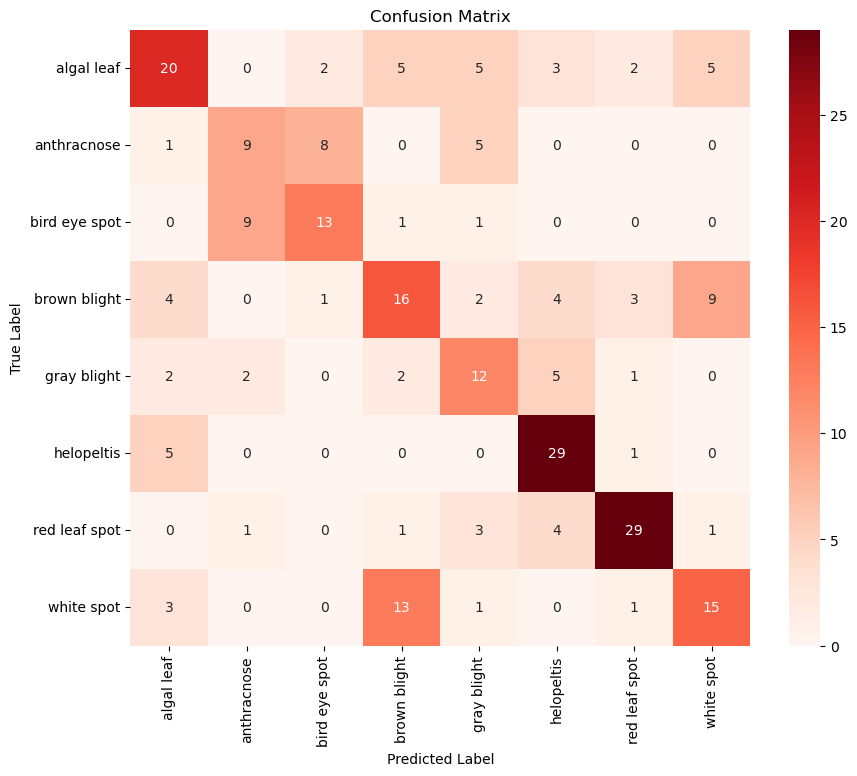

In [103]:


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Combine training and test labels to ensure consistent encoding
all_labels = np.concatenate((y_train, y_test))

# Fit LabelEncoder on combined labels
label_encoder = LabelEncoder()
label_encoder.fit(all_labels)

# Transform training and test labels
y_train_encoded = label_encoder.transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Initialize the LightGBM Classifier with custom parameters
lgb_clf = lgb.LGBMClassifier(num_leaves=7, objective='multiclass', force_col_wise=True)

# Train the model
try:
    lgb_clf.fit(X_train, y_train_encoded)
except ValueError as e:
    print("Error:", e)
    print("Unseen labels in y_train:", set(y_train) - set(label_encoder.classes_))
    print("Unseen labels in y_test:", set(y_test) - set(label_encoder.classes_))
    # Handle unseen labels here if needed

# Make predictions on the test data
y_pred_encoded = lgb_clf.predict(X_test)

# Decode predicted labels back to original strings
y_pred = label_encoder.inverse_transform(y_pred_encoded)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)*100
precision = precision_score(y_test, y_pred, average='weighted')*100
f1 = f1_score(y_test, y_pred, average='weighted')*100

# Print evaluation metrics
print("Accuracy:", "{:.2f}%".format(accuracy))
print("Precision:", "{:.2f}%".format(precision))
print("F1 Score:", "{:.2f}%".format(f1))

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', 
            xticklabels=label_encoder.classes_, 
            yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# LIGHT GBM HOG

# LEVEL 1 CLASSIFICATION

In [104]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt


import seaborn as sns
from skimage.feature import hog
from skimage.io import imread



from skimage.transform import resize
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [105]:
# Function to extract HOG features from an image
def extract_hog_features(image_path):
    # Read the image
    image = imread(image_path, as_gray=True)
    
    # Resize image to a fixed size (e.g., 128x128)
    resized_image = resize(image, (128, 128))
    
    # Compute HOG features
    features = hog(resized_image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys', visualize=False, multichannel=False)
    
    return features


# Path to the dataset
dataset_directory = "C:/Users/HP/Downloads/tea leaf/categories"

# Specify image preprocessing parameters
target_width = 128
target_height = 128
batch_size = 4


In [106]:

# Image data generator for preprocessing and data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    dataset_directory,
    target_size=(target_width, target_height),
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=True,  
    seed=42
)


class_mapping = train_generator.class_indices
class_counts = {class_label: sum(train_generator.classes == class_index) for class_label, class_index in class_mapping.items()}
for class_label, count in class_counts.items():
    print(f'{class_label}: {count} samples')




Found 1489 images belonging to 2 classes.
healthy: 197 samples
infected: 1292 samples


In [107]:
# Convert labels to binary: 1 for infected, 0 for healthy
labels = (train_generator.classes == class_mapping["infected"]).astype(int)



In [108]:
# Split the dataset into training and testing sets
X_train_files, X_test_files, y_train, y_test = train_test_split(train_generator.filepaths, labels, test_size=0.2, random_state=42)


In [109]:
from skimage.feature import hog
from skimage.transform import resize

def extract_hog_features(image_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Check if the image is valid
    if image is None:
        print(f"Error loading image: {image_path}")
        return None
    
    # Resize the image
    resized_image = resize(image, (128, 128))
    
    # Compute HOG features
    features = hog(resized_image, orientations=9, pixels_per_cell=(6, 6), cells_per_block=(2, 2), block_norm='L2-Hys')
    
    return features


In [110]:
import cv2
# Extract HOG features for training data
X_train = np.array([extract_hog_features(image_path) for image_path in X_train_files])

# Extract HOG features for testing data
X_test = np.array([extract_hog_features(image_path) for image_path in X_test_files])


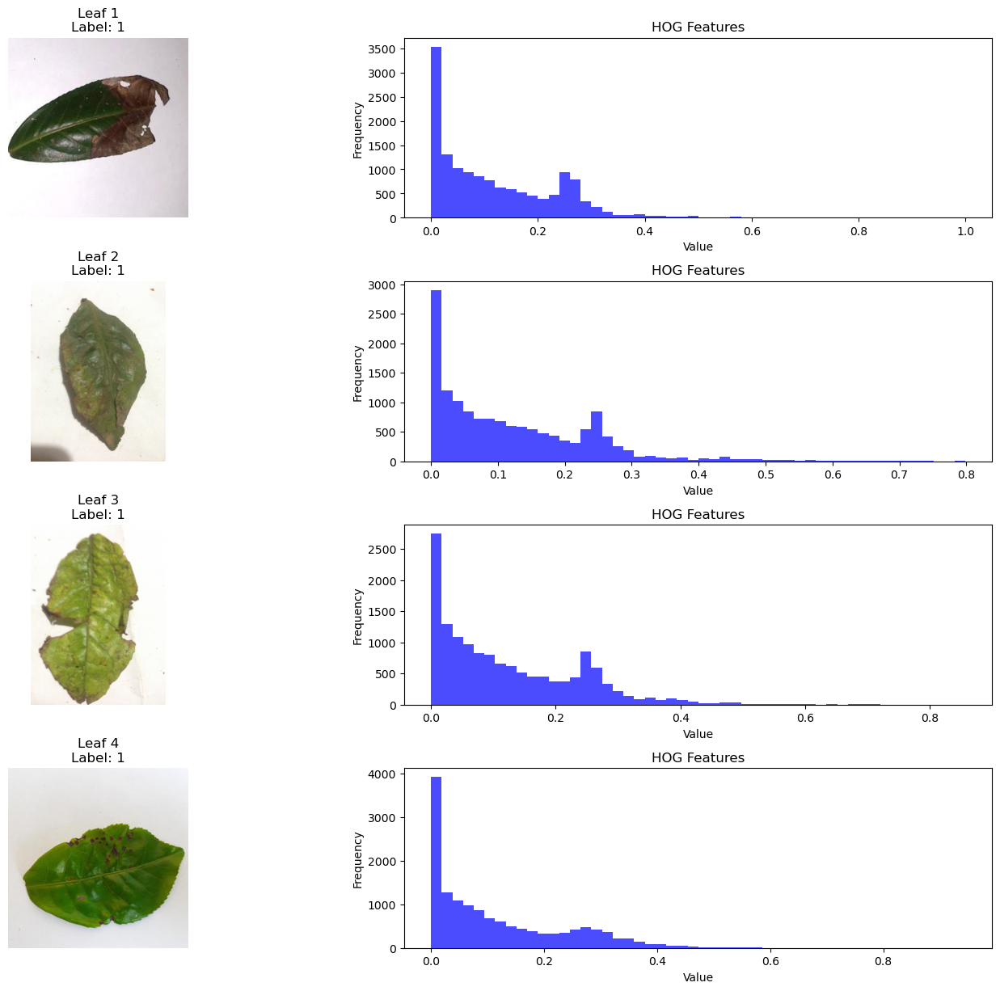

In [111]:
# Randomly select 10 image paths and labels
random_image_paths = np.random.choice(X_test_files, 4, replace=False)
random_labels = y_test[np.array([X_test_files.index(image_path) for image_path in random_image_paths])]

# Extract HOG features and plot leaf images with histograms as subplots
plt.figure(figsize=(15, 30))
for i, image_path in enumerate(random_image_paths, 1):
    # Extract HOG features
    features = extract_hog_features(image_path)
    
    # Plot leaf image
    plt.subplot(10, 2, 2*i-1)
    plt.imshow(imread(image_path), cmap='gray')
    plt.title(f"Leaf {i}\nLabel: {random_labels[i-1]}")
    plt.axis('off')
    
    # Plot histogram of HOG features
    plt.subplot(10, 2, 2*i)
    plt.hist(features, bins=50, color='blue', alpha=0.7)
    plt.title('HOG Features')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [112]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize the LightGBM Classifier with custom parameters
lgb_clf = LGBMClassifier(num_leaves=2, objective='binary', force_col_wise=True, random_state=4)

# Train the model
lgb_clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = lgb_clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)


[LightGBM] [Info] Number of positive: 1028, number of negative: 163
[LightGBM] [Info] Total Bins 3666795
[LightGBM] [Info] Number of data points in the train set: 1191, number of used features: 14400
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.863140 -> initscore=1.841620
[LightGBM] [Info] Start training from score 1.841620


Accuracy: 91.28%
Precision: 0.91
Recall: 1.00
F1-Score: 0.95


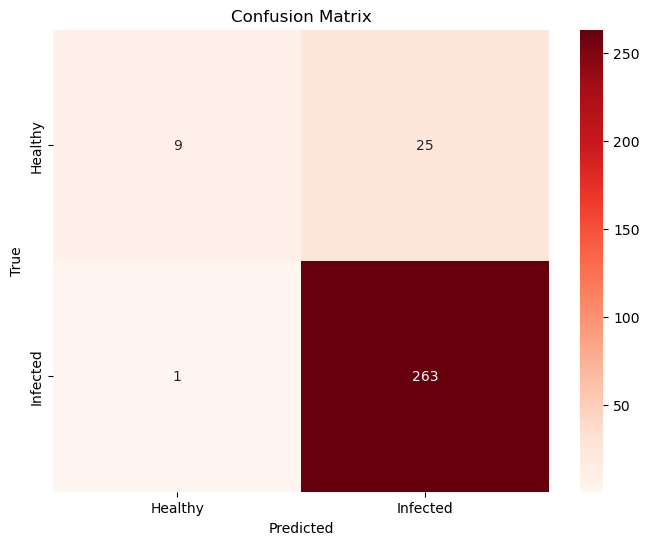

In [113]:
# Print evaluation metrics
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
labels = ['Healthy', 'Infected']
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Reds', fmt='g', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# LEVEL 2 CLASSIFICATION

In [114]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.feature import hog
import lightgbm as lgb
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
from sklearn.preprocessing import LabelEncoder
import seaborn as sns


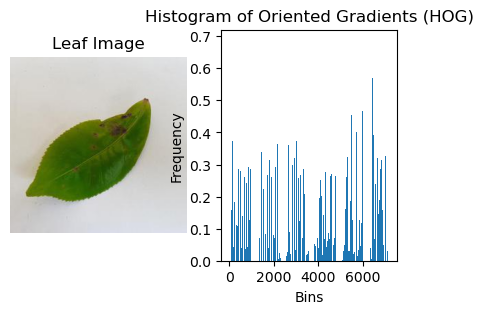

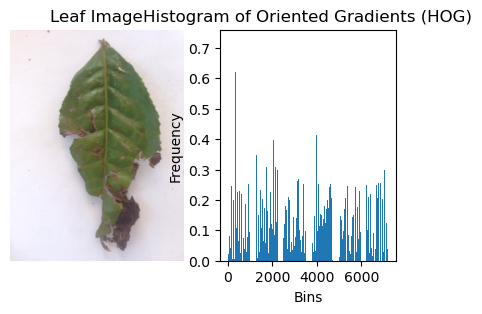

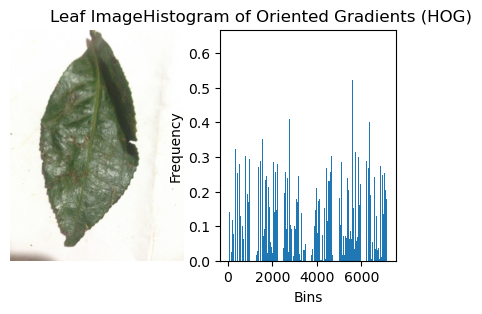

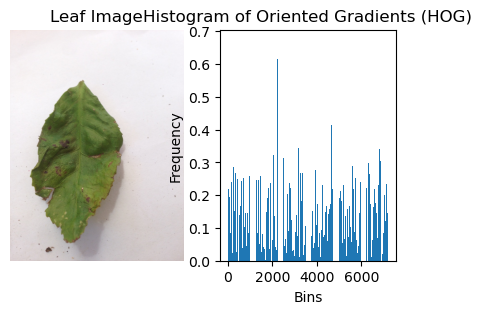

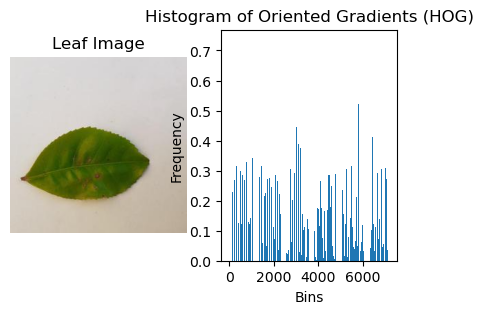

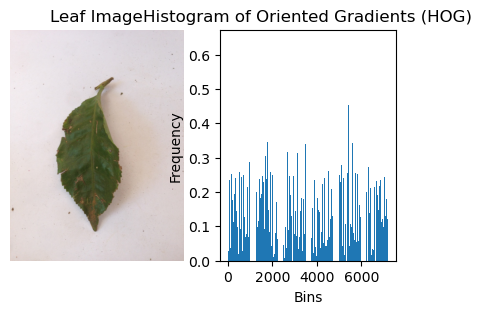

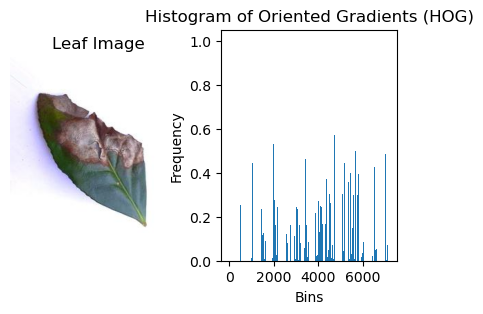

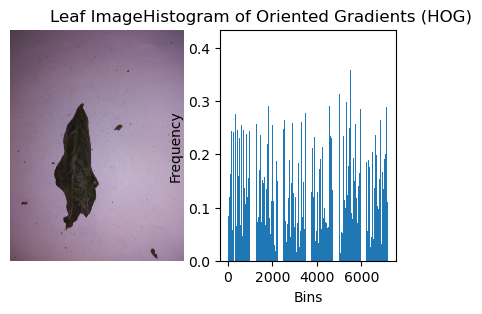

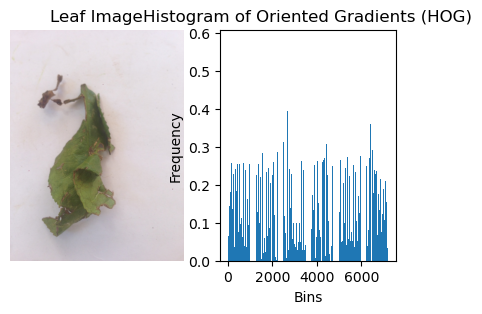

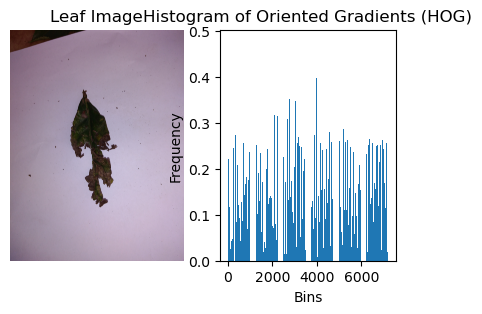

In [115]:

# Function to extract HOG features from an image
def extract_hog_features(image):
    # Ensure image has two spatial dimensions
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize the image if needed
    if image.shape != resize_shape:
        image = cv2.resize(image, resize_shape)
    
    hog_features, _ = hog(image, orientations=8, pixels_per_cell=(8, 8),
                          cells_per_block=(2, 2), visualize=True)
    return hog_features

# Function to load images, resize them, and extract features
def load_images_and_extract_features(disease_paths, resize_shape):
    images = []
    labels = []
    image_paths = []
    for disease, path in disease_paths.items():
        image_files = [f for f in os.listdir(path) if f.endswith('.jpg')]
        for image_name in image_files:
            image_path = os.path.join(path, image_name)
            image = cv2.imread(image_path)
            if image is None:
                print(f"Error reading image: {image_path}")
                continue
            
            hog_features = extract_hog_features(image)
            images.append(hog_features)
            labels.append(disease)
            image_paths.append(image_path)
    return images, labels, image_paths

# Define paths for each disease category
disease_paths = {
    "red leaf spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/red leaf spot",
    "white spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/white spot",
    "algal leaf": "C:/Users/HP/Downloads/tea leaf/categories/infected/algal leaf",
    "gray blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/gray blight",
    "anthracnose": "C:/Users/HP/Downloads/tea leaf/categories/infected/anthracnose",
    "bird eye spot": "C:/Users/HP/Downloads/tea leaf/categories/infected/bird eye spot",
    "brown blight": "C:/Users/HP/Downloads/tea leaf/categories/infected/brown blight",
    "helopeltis": "C:/Users/HP/Downloads/tea leaf/categories/infected/helopeltis"
}

# Define the size to which images will be resized
resize_shape = (128, 128)  # Adjust as needed

# Load images, resize them, and extract features
images, labels, image_paths = load_images_and_extract_features(disease_paths, resize_shape)

# Select 10 random leaf images along with their corresponding HOG features
random_indices = random.sample(range(len(images)), min(10, len(images)))
selected_images = [(images[i], labels[i], image_paths[i]) for i in random_indices]

# Display selected leaf images along with their HOG features
for hog_features, label, image_path in selected_images:
    # Load the corresponding leaf image
    leaf_image = cv2.imread(image_path)
    
    plt.figure(figsize=(5, 3))
    
    # Display the leaf image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(leaf_image, cv2.COLOR_BGR2RGB))
    plt.title('Leaf Image')
    plt.axis('off')
    
    # Display histogram
    plt.subplot(1, 2, 2)
    plt.bar(range(len(hog_features)), hog_features)
    plt.title('Histogram of Oriented Gradients (HOG)')
    plt.xlabel('Bins')
    plt.ylabel('Frequency')
    
    plt.show()


In [116]:
 #Initialize lists to store features and labels
X = []
y = []


In [117]:
# Load images and extract features
for disease, path in disease_paths.items():
    print(f"Processing images for {disease}...")
    for filename in os.listdir(path):
        try:
            if not filename.endswith('.DS_Store'):  # Skip .DS_Store files
                image_path = os.path.join(path, filename)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                features = extract_hog_features(image)
                if features is not None:
                    X.append(features)
                    y.append(disease)  # Use disease name as label
        except Exception as e:
            print(f"Error processing image {filename}: {e}")



Processing images for red leaf spot...
Processing images for white spot...
Processing images for algal leaf...
Processing images for gray blight...
Processing images for anthracnose...
Processing images for bird eye spot...
Processing images for brown blight...
Processing images for helopeltis...


In [118]:
# Convert lists to numpy arrays
X = np.array(X)
y = np.array(y)


[LightGBM] [Info] Total Bins 1809429
[LightGBM] [Info] Number of data points in the train set: 1033, number of used features: 7200
[LightGBM] [Info] Start training from score -1.909785
[LightGBM] [Info] Start training from score -2.596417
[LightGBM] [Info] Start training from score -2.609489
[LightGBM] [Info] Start training from score -1.970409
[LightGBM] [Info] Start training from score -1.956616
[LightGBM] [Info] Start training from score -1.834277
[LightGBM] [Info] Start training from score -1.816258
[LightGBM] [Info] Start training from score -2.295832
Accuracy: 62.93%
Precision: 64.25%
F1 Score: 63.05%


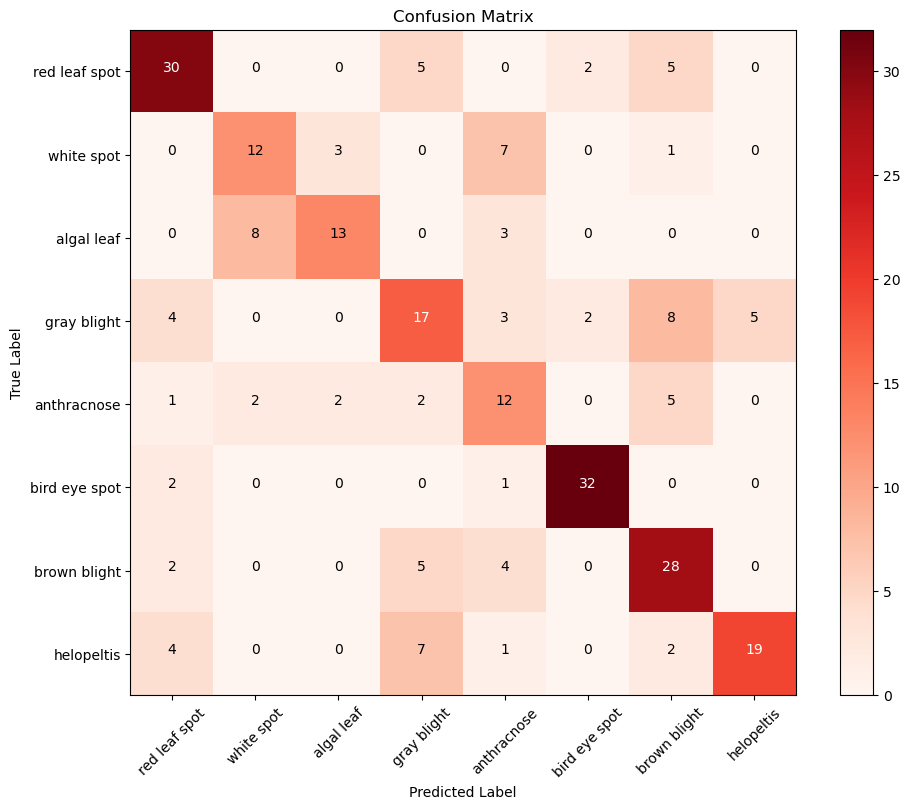

In [119]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score
import lightgbm as lgb

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the LightGBM Classifier with custom parameters
lgb_clf = lgb.LGBMClassifier(num_leaves=7, objective='multiclass', force_col_wise=True)

# Train the model
lgb_clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = lgb_clf.predict(X_test)

# Make predictions on the test data
y_pred = lgb_clf.predict(X_test)
# Calculate accuracy in percentage
accuracy = accuracy_score(y_test, y_pred) * 100

# Calculate precision in percentage
precision = precision_score(y_test, y_pred, average='weighted') * 100

# Calculate F1 score in percentage
f1 = f1_score(y_test, y_pred, average='weighted') * 100

print("Accuracy:", "{:.2f}%".format(accuracy))
print("Precision:", "{:.2f}%".format(precision))
print("F1 Score:", "{:.2f}%".format(f1))


import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = list(disease_paths.keys())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)

# Display values in each cell
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


